In [12]:
from sys import path as syspath
from pathlib import Path

syspath.append(str(Path().home() / "pyref" / "src"))

import pyref as rf
from pyref.style import science
import seaborn as sns
import matplotlib.pyplot as plt
import pickle as pkl
import pandas as pd
import numpy as np
from pypxr.structure import *
from pypxr.reflectivity import *
from refnx.dataset import ReflectDataset
from refnx.analysis import Transform, CurveFitter, Objective, GlobalObjective
from refnx._lib.emcee.moves.de import DEMove
from typing import Literal

In [13]:
%%html
<style>
.cell-output-ipywidget-background {
   background-color: transparent !important;
}
.jp-OutputArea-output {
   background-color: transparent;
}
</style>

# Benchmarking the different optical models

There are several optical models that can be used to simulate the optical model

1. Oxide (Amorphous) - Surface - Ordered Bulk - Patern - Carbon - SiO2 - Si
2. Surface - Ordered Bulk - Patern - Carbon - SiO2 - Si
3. Surface - Ordered Bulk - Carbon (With Ordering) - SiO2 - Si
4. Oxide (Amorphous) - Surface - Ordered Bulk - Carbon (With Ordering) - SiO2 - Si
5. Surface - Ordered Bulk - Carbon - SiO2 - Si
6. Oxide (Amorphous) - Surface - Ordered Bulk - Carbon - SiO2 - Si


# Annoyingly Long Data Import Methods - Improve this later

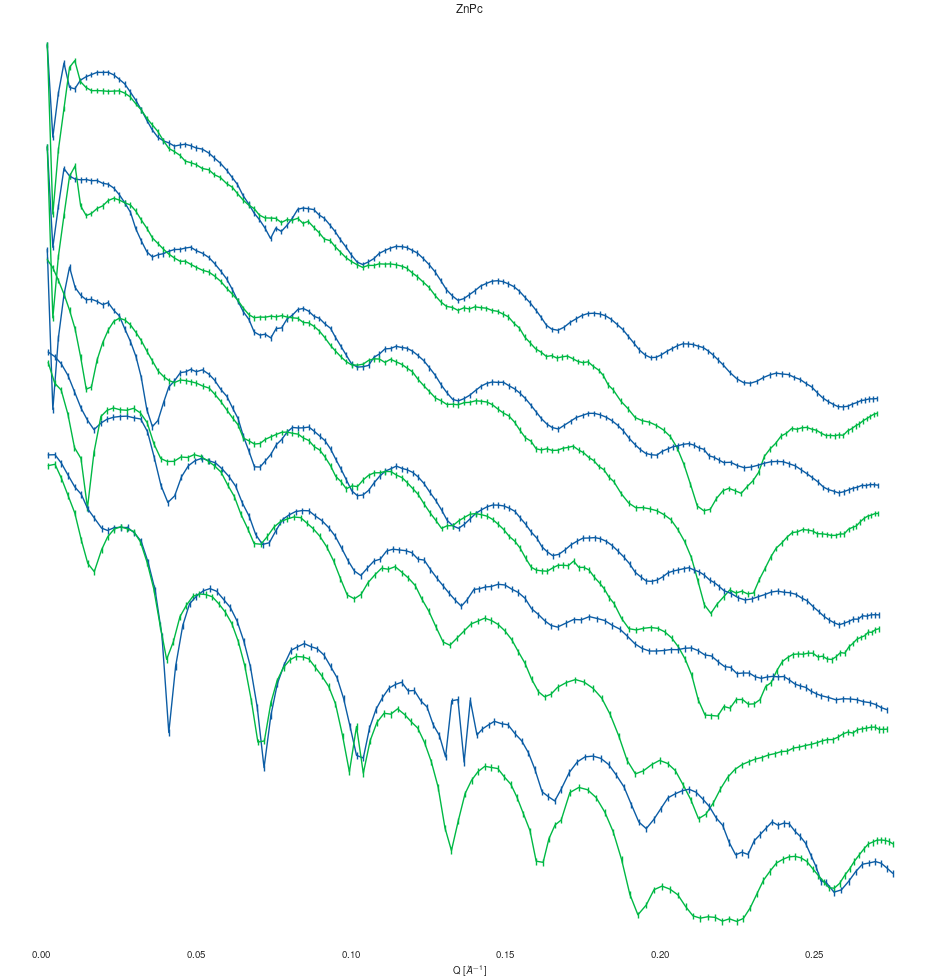

In [14]:
# Import and setup two "Long" data sets

db = rf.db()

znpc_oc = db.get_oc("C32H16N8Zn")
znpc_mono = {
    "283.7": {
        "s": db.get_refl("ZnPc_283.7_100.0 (CCD Scan 82865).parquet", "ZnPc"),
        "p": db.get_refl("ZnPc_283.7_190.0 (CCD Scan 82869).parquet", "ZnPc"),
    },
    "284.0": {
        "s": db.get_refl("ZnPc_284.0_100.0 (CCD Scan 82865).parquet", "ZnPc"),
        "p": db.get_refl("ZnPc_284.0_190.0 (CCD Scan 82869).parquet", "ZnPc"),
        },
    "284.2": {
        "s": db.get_refl("ZnPc_284.2_100.0_refl (CCD Scan 82867).parquet", "ZnPc"),
        "p": db.get_refl("ZnPc_284.2_190.0_refl (CCD Scan 82872).parquet", "ZnPc"),
    },
    "287.0": {
        "s": db.get_refl("ZnPc_287.0_100.0_refl (CCD Scan 82259).parquet", "ZnPc"),
        "p": db.get_refl("ZnPc_287.0_190.0_refl (CCD Scan 82261).parquet", "ZnPc"),
    },
    "289.0": {
        "s": db.get_refl("ZnPc_289.0_100.0_refl (CCD Scan 82259).parquet", "ZnPc"),
        "p": db.get_refl("ZnPc_289.0_190.0_refl (CCD Scan 82261).parquet", "ZnPc"),
    }
}
fig, ax = plt.subplots(nrows = len(znpc_mono.keys()), figsize = (12, 12),sharex=True, gridspec_kw={"hspace":-.8})

for i, (k,v) in enumerate(znpc_mono.items()):
    v["s"].plot(ax = ax[i], x = "Q", y = "Refl", yerr = "Err", label = "s", logy = True, color = "C0", legend = False)
    v["p"].plot(ax = ax[i], x = "Q", y = "Refl", yerr = "Err", label = "p", logy = True, color = "C1", legend = False)

    if i == 0:
        ax[i].set(
            title = "ZnPc",
            ylabel = r"$I_r / I_0$",
        )
    elif i == len(znpc_mono.keys()) - 1:
        ax[i].set(
            xlabel = r"Q [$\AA^{-1}$]",
            ylabel = r"$I_r / I_0$",
        )
    ax[i].set(
        yticks = [],
        ylabel="",
    )
    ax[i].minorticks_off()
    ax[i].grid(False)
    ax[i].tick_params(axis="x", which="both", bottom=False, top=False)
    ax[i].spines["left"].set_visible(False)
    ax[i].spines["right"].set_visible(False)
    ax[i].spines["top"].set_visible(False)
    ax[i].spines["bottom"].set_visible(False)

C:\Users\hduva\AppData\Local\Temp\ipykernel_11856\816676319.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  s_pol = s[(s["Q"] != 0.0757)][s["Q"] != 0.0740]
C:\Users\hduva\AppData\Local\Temp\ipykernel_11856\816676319.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  p_pol = p[(p["Q"] != 0.0757)][p["Q"] != 0.0740]


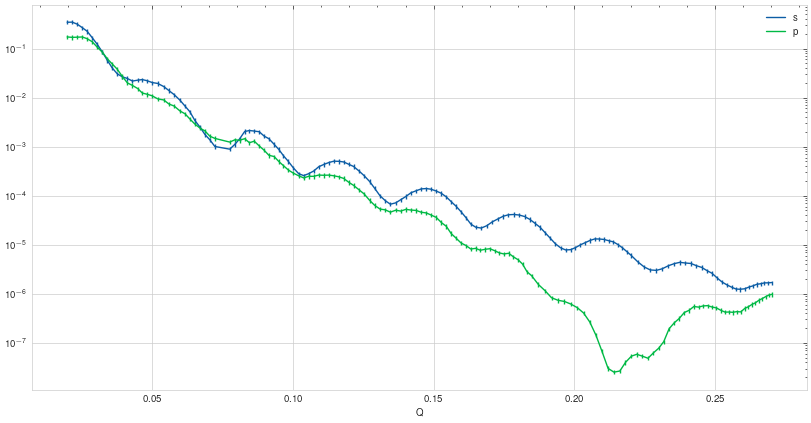

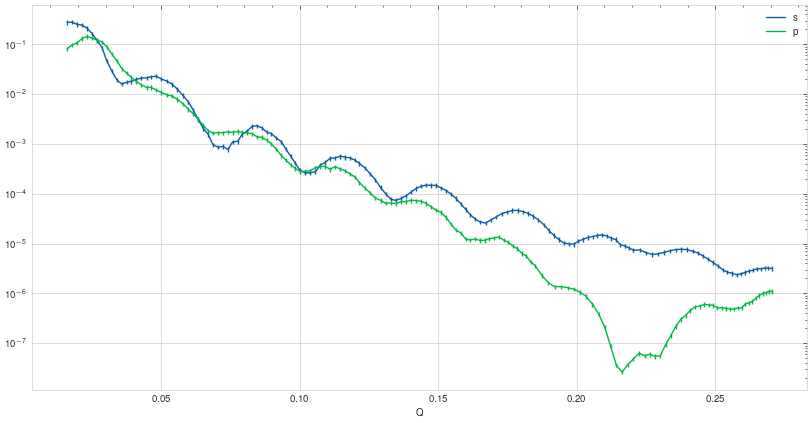

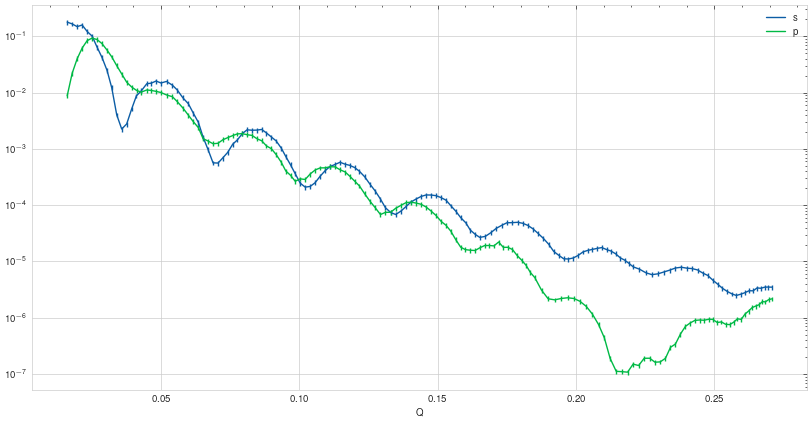

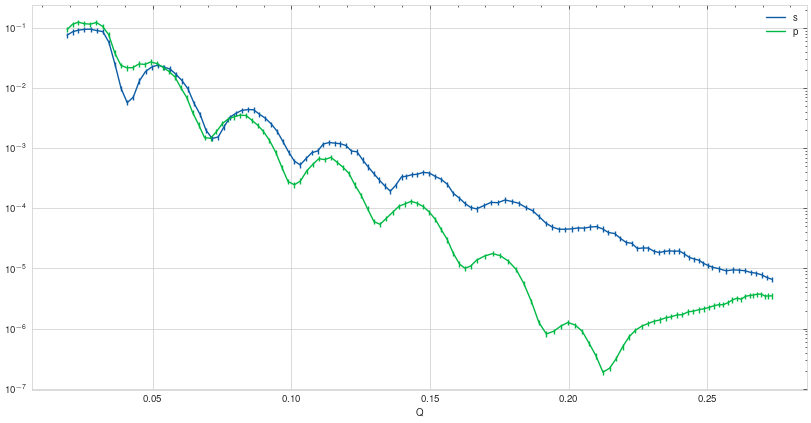

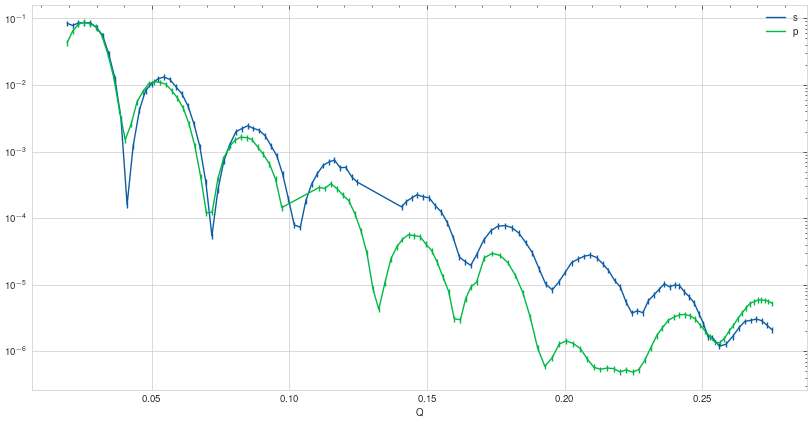

In [15]:
data = []
en:list[float] = [float(k) for k in znpc_mono.keys() if k != "250"]

def mask(s, p):
    s_pol = s[(s["Q"] != 0.0757)][s["Q"] != 0.0740]
    p_pol = p[(p["Q"] != 0.0757)][p["Q"] != 0.0740]
    return s_pol.iloc[10:], p_pol.iloc[10:]

for i, e in enumerate(znpc_mono.keys()):
    cutoff = 8
    s = znpc_mono[f"{e}"]["s"].iloc[cutoff:]
    p = znpc_mono[f"{e}"]["p"].iloc[cutoff:]
    if e == "283.7":
        s, p = mask(znpc_mono[f"{e}"]["s"], znpc_mono[f"{e}"]["p"])

    if e == "289.0":
        p = p[~((p["Q"] > .099) & (p["Q"] < .109))]
        s = s[~((s["Q"] > .125) & (s["Q"] < .14))]


    fig, ax = plt.subplots()
    s.plot(ax = ax, x = "Q", y = "Refl", yerr = "Err", logy = True, label = "s")
    p.plot(ax = ax, x = "Q", y = "Refl", yerr = "Err", logy = True, label = "p")
    data.append(rf.to_refnx_dataset(s, pol="sp", second_pol=p))


In [16]:
from numpy import array, ndarray
from typing import Literal
from copy import deepcopy

type _bound = tuple[float, float]
type complex_bound = dict[Literal["r", "i"], _bound]
type bound = dict[Literal["xx", "zz"], complex_bound]

# Collect structure parameters
znpc_mono_struct_file = db.get_struct("ZnPc_RoomTemp")
znpc_oc = db.get_oc("C32H16N8Zn")

si_thick = znpc_mono_struct_file["Si"]["thickness"]
si_rough = znpc_mono_struct_file["Si"]["roughness"]
si_density = znpc_mono_struct_file["Si"]["density"]

sio2_thick = znpc_mono_struct_file["SiO2"]["thickness"]
sio2_rough = znpc_mono_struct_file["SiO2"]["roughness"]
sio2_density = znpc_mono_struct_file["SiO2"]["density"]

c_amor_thick = znpc_mono_struct_file["C"]["thickness"]
c_amor_rough = znpc_mono_struct_file["C"]["roughness"]
c_amor_density = znpc_mono_struct_file["C"]["density"]

znpc_thick = znpc_mono_struct_file["C32H16N8Zn"]["thickness"]
znpc_rough = znpc_mono_struct_file["C32H16N8Zn"]["roughness"]
znpc_density = znpc_mono_struct_file["C32H16N8Zn"]["density"]


def n_limits(e, density) -> tuple[list[bound], list[ndarray]]:
    bounds: list[complex_bound] = []
    ns = znpc_oc(e,density=density)
    if not isinstance(ns, list):
        ns = [ns]
    for i in e:
        xx_r = (znpc_oc.zz(i), znpc_oc.xx(i))
        xx_i = (znpc_oc.ixx(i), znpc_oc.izz(i))

        zz_r = xx_r
        zz_i = xx_i

        xx_bound: complex_bound = {"r": xx_r, "i": xx_i}
        zz_bound: complex_bound = {"r": zz_r, "i": zz_i}
        bounds.append({"xx": xx_bound, "zz": zz_bound})

    return bounds, ns


bounds, n_bulk = n_limits(en, znpc_density)
n_bulk[0] = np.asarray([-0.000784 + 0.000627j, -0.000144 + 0.000387j])
n_bulk[1] = np.asarray([-0.001457 + 0.001307j, -0.000317 + 0.000387j])
n_bulk[2] = np.asarray([-0.001457 + 0.001307j, -0.000317 + 0.000387j])
n_bulk[3] = np.asarray([-0.001457 + 0.001307j, -0.000317 + 0.000387j])

# Construct the Structures

Annoyingly, these structures are not immutable objects, so we need to make several copies of the same structures to avoid overwriting the same object.

In [17]:
vac = [PXR_MaterialSLD("", 0, e)(0, 0) for e in en]

surf_thick = 9.53276
surf_rough = 7.52292

patern_thick = 9.51586
patern_rough = 3.72188

oxide = [
    PXR_MaterialSLD("C", c_amor_density, e, name="Oxide")(surf_thick, surf_rough)
    for e in en
]
surf = [
    PXR_SLD(n, symmetry="uni", name="Surface")(surf_thick, surf_rough)
    for n in n_bulk
]
bulk = [
    PXR_SLD(n, symmetry="uni", name="Bulk")(
        znpc_thick - surf_thick, znpc_rough / 2
    )
    for n in n_bulk
]
patern = [
    PXR_SLD(n, symmetry="uni", name="Patern")(patern_thick, patern_rough)
    for n in n_bulk
]
c_ordered = [
    PXR_SLD(n, symmetry="uni", name="C_Ordered")(c_amor_thick, c_amor_rough)
    for n in n_bulk
]
c_amor = [
    PXR_MaterialSLD("C", c_amor_density, e, name="C_Amorphous")(
        c_amor_thick, c_amor_rough
    )
    for e in en
]
si = [PXR_MaterialSLD("Si", 2.33, e, name="Si")(si_thick, si_rough) for e in en]
sio2 = [
    PXR_MaterialSLD("SiO2", sio2_density, e, name="SiO2")(sio2_thick, sio2_rough)
    for e in en
]

In [18]:
for slab in si:
    slab.thick.setp(vary=False)
    slab.rough.setp(vary=False)

for slab in sio2:
    slab.thick.setp(vary=False)
    slab.rough.setp(vary=False)
    slab.sld.density.setp(vary=False)

for slab in c_amor:
    slab.thick.setp(vary=True, bounds=(0, surf_thick))
    slab.rough.setp(vary=True, bounds=(0, surf_rough))
    slab.sld.density.setp(vary=False, bounds=slab.sld.density.value * array([0.8, 1.2]))

for slab in oxide:
    slab.thick.setp(vary=True, bounds=(0, surf_thick))
    slab.rough.setp(vary=True, bounds=(0, znpc_rough))
    slab.sld.density.setp(vary=True, bounds=(0, 1.37429051377332))

# Applied for the znpc layers
def sld_constraint(
    slab: PXR_Slab,
    bounds: bound | None = None,
    xx_bounds: _bound = (-0.005, 0.005),
    zz_bounds: _bound = (-0.005, 0.005),
    thick_bounds: _bound = None,
):
    if bounds is None:
        bounds = {"xx": {"r": xx_bounds, "i": xx_bounds}, "zz": {"r": zz_bounds, "i": zz_bounds}}
    slab.sld.xx.setp(vary=True, bounds=bounds["xx"]["r"])
    slab.sld.zz.setp(vary=True, bounds=bounds["zz"]["r"])
    slab.sld.ixx.setp(vary=True, bounds=bounds["xx"]["i"])
    slab.sld.izz.setp(vary=True, bounds=bounds["zz"]["i"])
    if thick_bounds is not None:
        slab.thick.setp(vary=True, bounds=thick_bounds)
    else:
        slab.thick.setp(vary=True, bounds=(0, znpc_thick))
    slab.rough.setp(vary=True, bounds=(0, znpc_rough))

_ = [sld_constraint(slab, bounds=bound) for (slab, bound) in zip(bulk, bounds)]
_ = [sld_constraint(slab, bounds=bound) for (slab, bound) in zip(surf, bounds)]
_ = [sld_constraint(slab, bounds=bound) for (slab, bound) in zip(c_ordered, bounds)]
_ = [sld_constraint(slab, bounds=bound) for (slab, bound) in zip(patern, bounds)]

for i, slab in enumerate(bulk):
    slab.thick.setp(vary=None, constraint = znpc_thick - surf[i].thick.value)

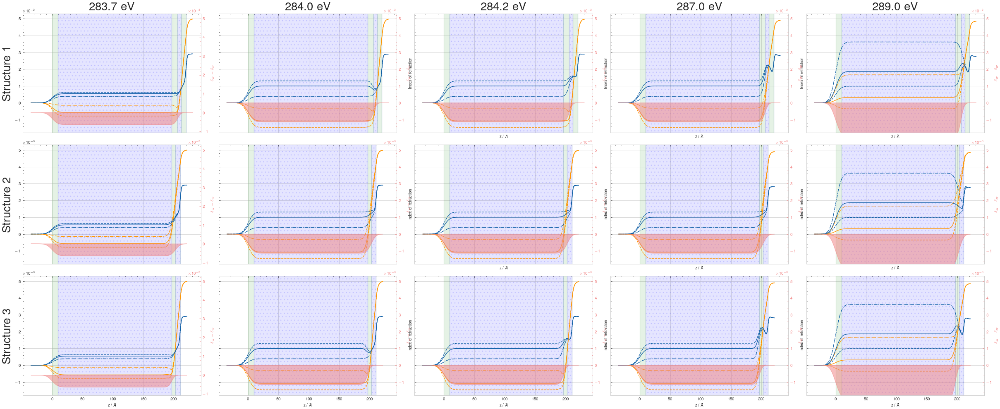

In [19]:
from copy import deepcopy


substrate =  [sio2[i] | si[i] for i in range(len(en))]

'''
1. Surface - Ordered Bulk - Patern - Carbon - SiO2 - Si
2. Surface - Ordered Bulk - Carbon (With Ordering) - SiO2 - Si
3. Surface - Ordered Bulk - Carbon - SiO2 - Si
'''

struc_1 = [
    vac[i] | surf[i] | bulk[i] | patern[i] | c_amor[i] | substrate[i]
    for i in range(len(en))
]
struc_2 = [
    vac[i] | deepcopy(surf[i]) | deepcopy(bulk[i]) | deepcopy(c_ordered[i]) | deepcopy(substrate[i])
    for i in range(len(en))
]
struc_3 = [
    vac[i] | deepcopy(surf[i]) | deepcopy(bulk[i]) | deepcopy(c_amor[i]) | deepcopy(substrate[i])
    for i in range(len(en))
]

strucs = [struc_1, struc_2, struc_3]

def show_comparison():
    fig, ax = plt.subplots(nrows = 3, ncols = len(en), figsize = (30, 12), sharex = True, sharey = True, gridspec_kw = {"hspace": 0.1, "wspace": 0.1})

    for i, e in enumerate(en):
        ax[0][i].set_title(f"{e} eV", fontsize = 20)

        struc_1[i].plot(ax = ax[0][i])
        struc_2[i].plot(ax = ax[1][i])
        struc_3[i].plot(ax = ax[2][i])

    for i in range(3):
        ax[i][0].set_ylabel(f"Structure {i+1}", fontsize = 20)
        ax[i][1].set_ylabel("")
        if i != 2:
            ax[i][1].set_xlabel("")
            ax[i][0].set_xlabel("")

show_comparison()

In [20]:
# Apply multi energy thickness and roughness constraints

def multi_energy_constraints(struc: list[PXR_Structure]):
    variable_slabs = struc[0].data
    const_slabs = struc[1].data

    for (vary, const) in zip(variable_slabs, const_slabs):
        if const.thick.vary:
            if const.name == "Bulk":
                vary.thick.setp(vary=None, constraint = znpc_thick - np.sum([slab.thick.value for slab in variable_slabs]))
            const.thick.setp(vary=None, constraint=vary.thick.value)
            const.rough.setp(vary=None, constraint=vary.rough.value)
            if const.name == "SiO2":
                const.sld.density.setp(vary=None,constraint = vary.sld.density.value)
            elif "C_Amorphous" in const.name:
                const.sld.density.setp(vary=None, constraint = vary.sld.density.value)

_ = [multi_energy_constraints(struc) for struc in strucs]

# Construct the Objective Functions and Models

________________________________________________________________________________
Objective - Surface | Ordered Bulk | Patern | Carbon | SiO2 | Si 283.7eV
Dataset = <None>, 279 points
datapoints = 279
chi2 = 18645.105911016286
Weighted = True
Transform = Transform('logY')
________________________________________________________________________________
Parameters: 'Struc0-283.7eV'
________________________________________________________________________________
Parameters: 'instrument parameters'
<Parameter:'dq - resolution', value=0  (fixed) , bounds=[-inf, inf]>
<Parameter:  'q_offset'   , value=0  (fixed) , bounds=[-inf, inf]>
<Parameter:  'en_offset'  , value=0  (fixed) , bounds=[-inf, inf]>
<Parameter:     'bkg'     , value=0  (fixed) , bounds=[-inf, inf]>
<Parameter:   'scale_s'   , value=1          , bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=1          , bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=0.5          , bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', 

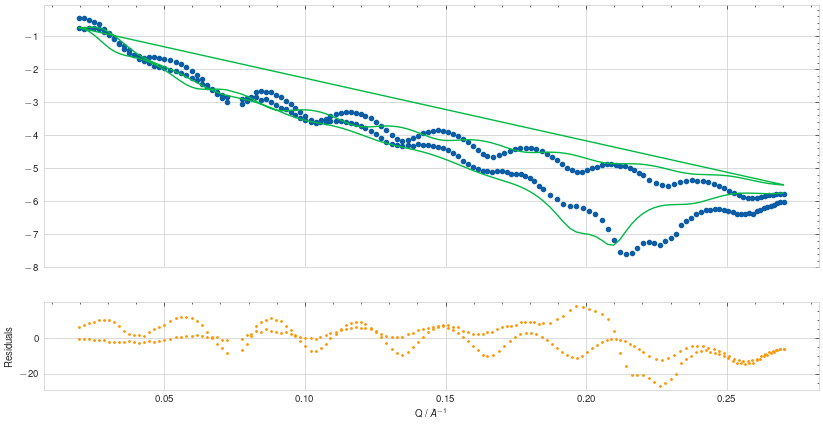

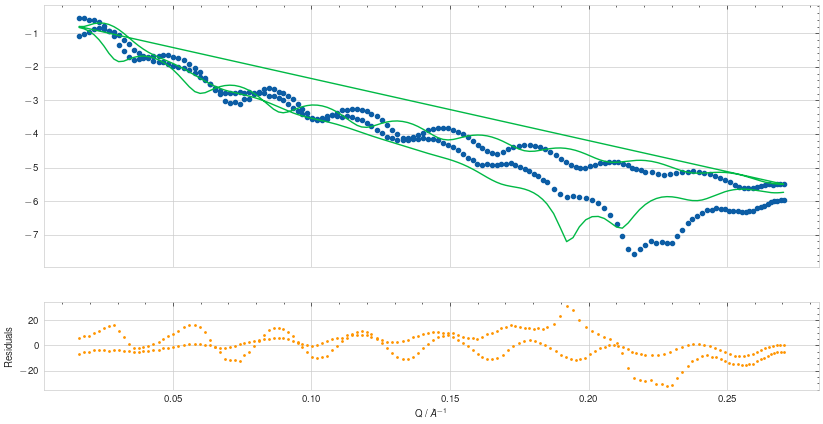

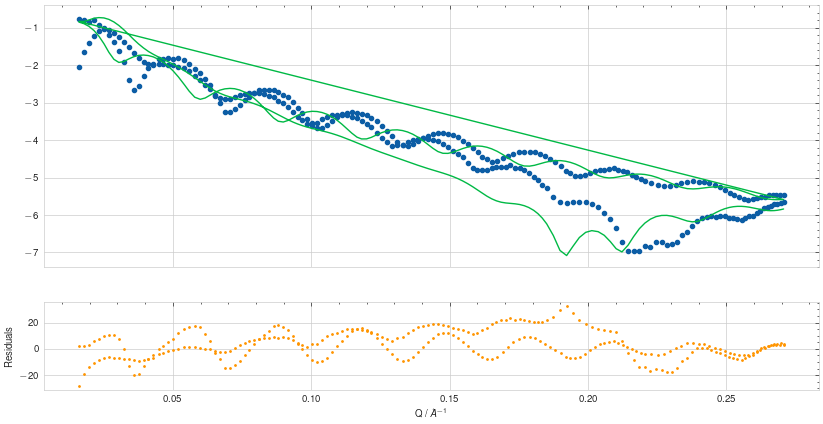

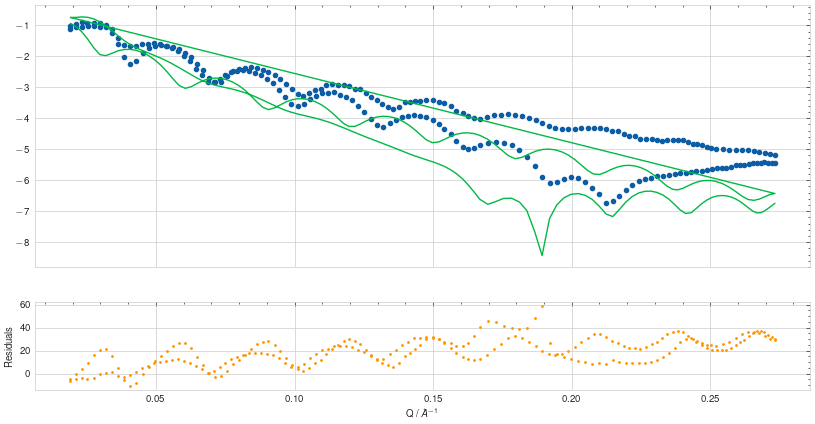

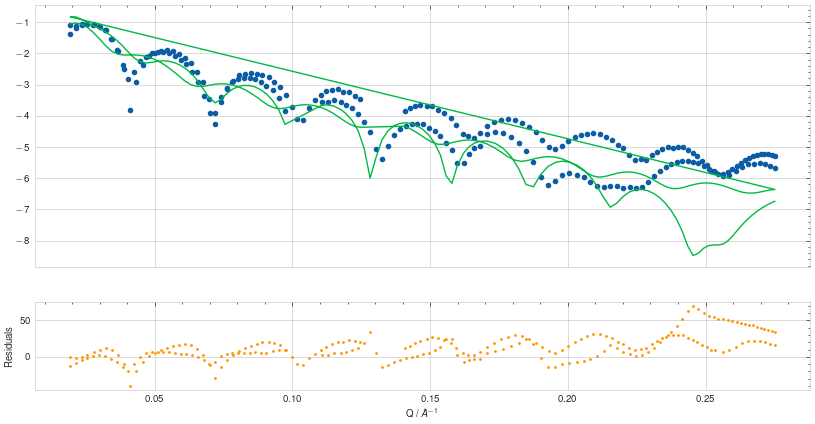

...

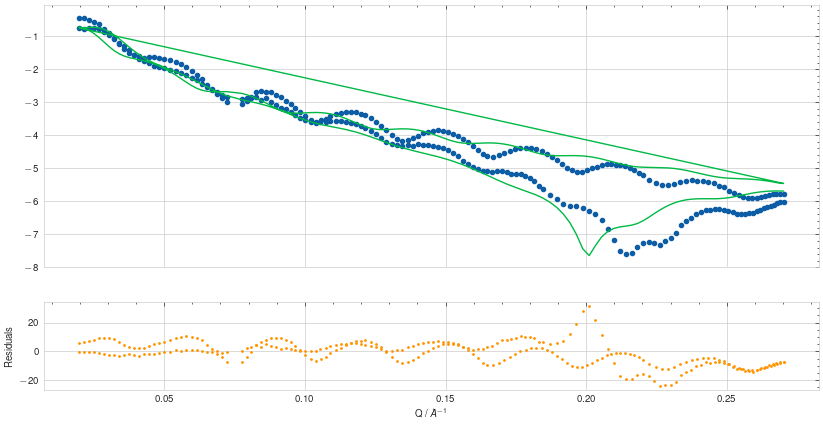

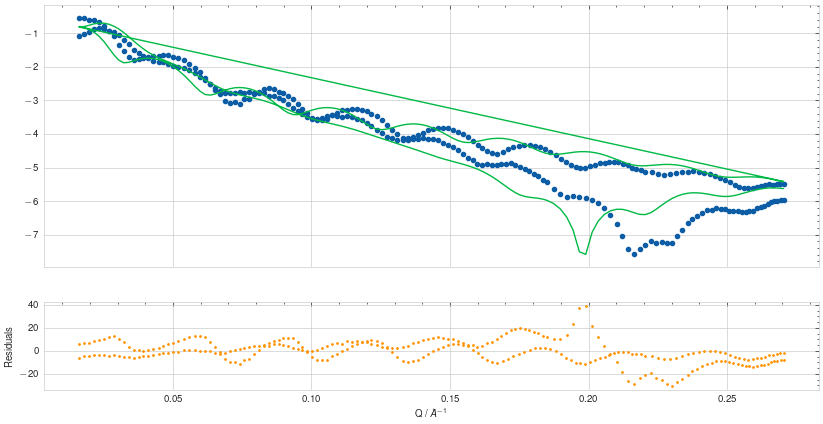

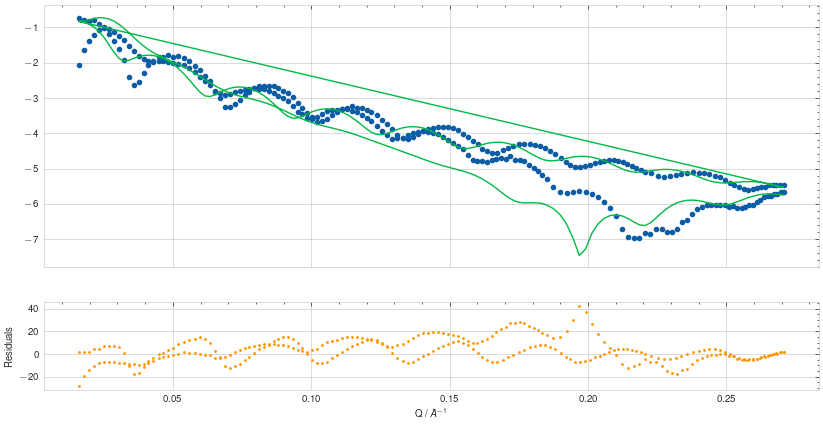

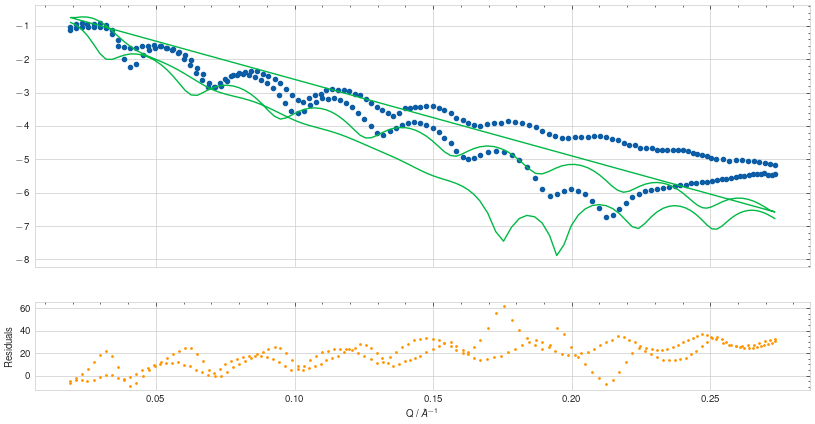

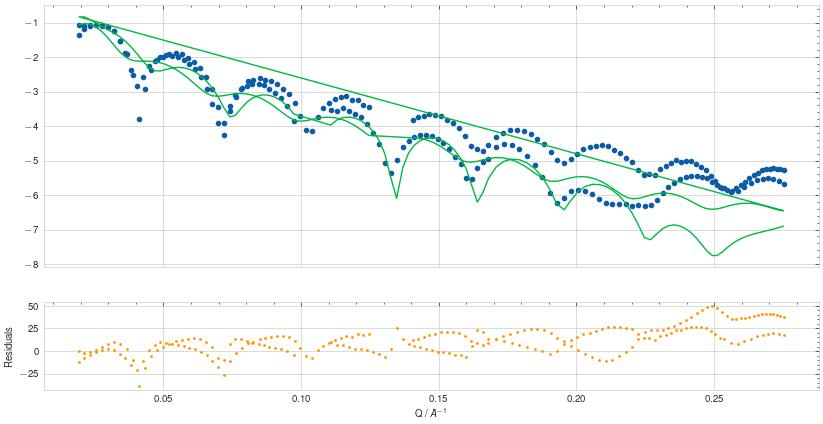

In [21]:
from pyref.fitting.logp import LogpExtra_rough as LogpExtra

_s = [
    "Surface | Ordered Bulk | Patern | Carbon | SiO2 | Si",
    "Surface | Ordered Bulk | Carbon (With Ordering) | SiO2 | Si",
    "Surface | Ordered Bulk | Carbon | SiO2 | Si",
]

obj_list = []
for j, struc in enumerate(strucs):
    objs = []
    for i, e in enumerate(en):
        model = PXR_ReflectModel(struc[i], pol = "sp", energy = e, name = f"Struc{j}-{e}eV", theta_offset={"s": .5, "p": -.5})
        model.scale_s.setp(vary = True, bounds = (0.6, 1.2))
        model.scale_p.setp(vary = True, bounds = (0.6, 1.2))
        model.theta_offset_s.setp(vary = True, bounds = (-1, 1))
        model.theta_offset_p.setp(vary = True, bounds = (-1, 1))

        obj = Objective(model, data[i], transform=Transform("logY"), name = _s[j] + f" {e}eV")
        print(obj)
        lpe = LogpExtra(obj)
        obj.logp_extra = lpe
        obj.plot(resid=True)
        objs.append(obj)
    obj_list.append(objs)

In [22]:
import pickle as pkl

class Fitter:
    # Suppresses the warning
    from warnings import simplefilter

    simplefilter("ignore")

    def __init__(self, obj: Objective | GlobalObjective, en, walkers_per_param=10, burn_in = 0):
        self.obj = obj
        self.move = [
            (DEMove(sigma=1e-7), 0.90),
            (DEMove(sigma=1e-7, gamma0=1), 0.1),
        ]
        if obj.__class__.__name__ == "GlobalObjective":
            self.n_params = sum([len(o.data.data[0]) - len(o.varying_parameters()) for o in obj.objectives])
        else:
            self.n_params = len(self.obj.data.data[0]) - len(self.obj.varying_parameters())
        self._n_walkers = walkers_per_param*len(self.obj.varying_parameters())
        self.burn_in = burn_in
        self.fitter = CurveFitter(obj, nwalkers=self._n_walkers, moves=self.move)
        self.en = en

    @property
    def n_walkers(self):
        return self._n_walkers

    @n_walkers.setter
    def n_walkers(self, value):
        self._n_walkers = value
        self.fitter = CurveFitter(self.obj, nwalkers=self._n_walkers, moves=self.move)

    def red_chisqr(self):
        try:
            return self.obj.chisqr() / self.n_params
        except:
            return np.nan

    def fit(
        self,
        steps_per_param=20,
        thin=1,
        seed=1,
        init: Literal["jitter", "prior"] = "jitter",
        show_output=False,
    ):
        steps = steps_per_param * self.n_params
        burn = int(steps * self.burn_in)

        self.fitter.initialise(init, random_state=seed)
        self.chain = self.fitter.sample(
            steps,
            random_state=seed,
            nthin=thin,
            skip_initial_state_check=True,
            nburn=burn,
        )
        print(f"Reduced χ2 = {self.red_chisqr()}")
        if show_output:
            self.show_output()
            self.export(f"{self.en}.pkl")

    def show_output(self):
        print(self.obj.varying_parameters())
        fig, ax = plt.subplots()
        lp = self.fitter.logpost
        ax.plot(-lp)
        if self.obj.__class__.__name__ == "GlobalObjective":
            for o in self.obj.objectives:
                o.plot(resid=True)
                plt.show()
        else:
            self.obj.plot(resid=True)
            plt.show()
        self.export(f"{self.en}.pkl")

    def export(self, filename: str):
        with open(filename, "wb") as f:
            pkl.dump(self, f)

    def delete_obj(self):
        del self

class MultiEnFitter:
    def __init__(self, objs: list[Objective], en_list: list[float]):
        self.objs = objs
        self.ens = en_list

    def fit_obj(self,n: int, N: int = 1, fitter = None, reset = False):
        if fitter is None:
            fitter = Fitter(obj = self.objs[n], en = self.ens[n])
            fitter.fit(init="jitter", steps_per_param=20*N)

        fitter.fit(init="jitter", steps_per_param=5*N)
        if fitter.red_chisqr() > 1 and N < 4:
            print(f"Red χ2 = {fitter.red_chisqr()}. Refitting with {N+1}x walkers")
            N+=2
            self.fit_obj(n, N, fitter, reset)
        else:
            fitter.show_output()
            fitter.export(f"{self.objs[n].model.name}.pkl")

    def fit(self, N: int = 1):
        for i in range(len(self.objs)):
            print(f"Fitting {self.objs[i].name}")
            self.fit_obj(i, N)

Fitting Surface | Ordered Bulk | Patern | Carbon | SiO2 | Si 283.7eV


100%|██████████| 5120/5120 [33:32<00:00,  2.54it/s] 


Reduced χ2 = 3.02803673053732


100%|██████████| 1280/1280 [11:06<00:00,  1.92it/s]


Reduced χ2 = 1.8654586521624261
Red χ2 = 1.8654586521624261. Refitting with 2x walkers


100%|██████████| 3840/3840 [37:00<00:00,  1.73it/s] 


Reduced χ2 = 1.6617849725582716
Red χ2 = 1.6617849725582716. Refitting with 4x walkers


100%|██████████| 6400/6400 [1:01:19<00:00,  1.74it/s]


Reduced χ2 = 1.6520107409374993
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=0.782245 +/- 0.0179, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=1.11527 +/- 0.0286, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.988202 +/- 0.0133, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.534727 +/- 0.0428, bounds=[-1.0, 1.0]>
<Parameter:'Surface_thick', value=5.20252 +/- 0.554, bounds=[0.0, 196.441]>
<Parameter: 'Surface_xx'  , value=7.10562e-07 +/- 6.02e-05, bounds=[-0.004487785909452915, 0.0004955200281860432]>
<Parameter: 'Surface_ixx' , value=0.000224769 +/- 2.06e-05, bounds=[0.00020494953411908198, 0.0011120068493401239]>
<Parameter: 'Surface_zz'  , value=-0.000173587 +/- 0.000142, bounds=[-0.004487785909452915, 0.0004955200281860432]>
<Parameter: 'Surface_izz' , value=0.000951642 +/- 6.4e-05, bounds=[0.00020494953411908198, 0.0011120068493401239]>
<Parameter:'Surface_

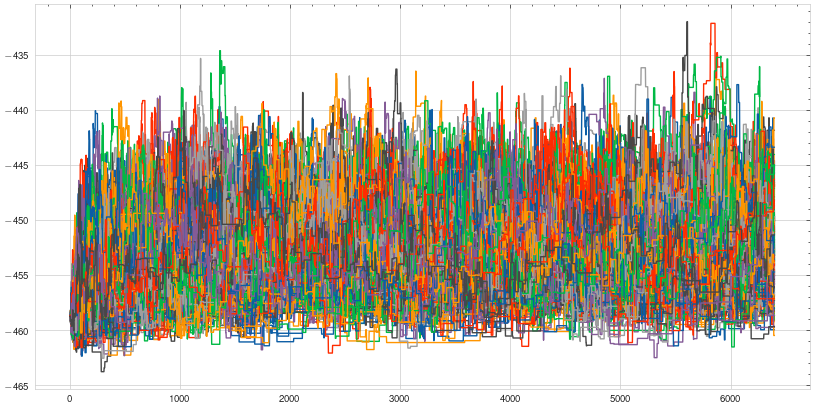

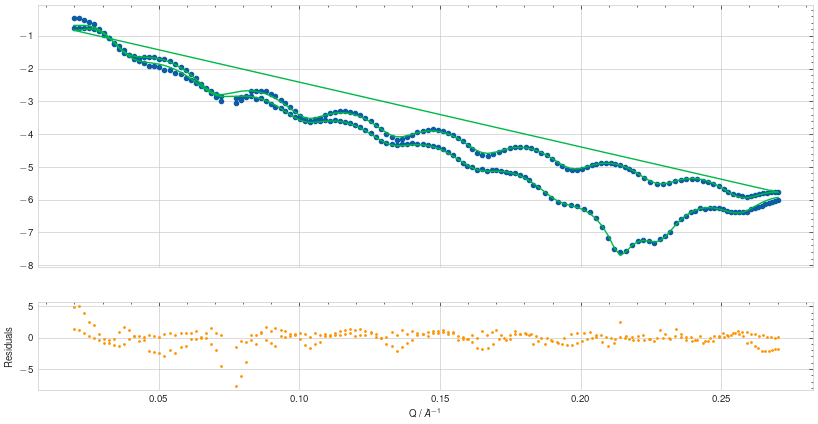

Fitting Surface | Ordered Bulk | Patern | Carbon | SiO2 | Si 284.0eV


100%|██████████| 5400/5400 [31:52<00:00,  2.82it/s]


Reduced χ2 = 6.272826971619942


100%|██████████| 1350/1350 [09:09<00:00,  2.46it/s]


Reduced χ2 = 6.1851179878145865
Red χ2 = 6.1851179878145865. Refitting with 2x walkers


100%|██████████| 4050/4050 [27:48<00:00,  2.43it/s]


Reduced χ2 = 6.182106138896493
Red χ2 = 6.182106138896493. Refitting with 4x walkers


100%|██████████| 6750/6750 [45:10<00:00,  2.49it/s]


Reduced χ2 = 6.1818821135196815
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=0.892911 +/- 0.0141, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=1.03636 +/- 0.0182, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.997914 +/- 0.00252, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.968566 +/- 0.0262, bounds=[-1.0, 1.0]>
<Parameter: 'Surface_xx'  , value=-0.00101237 +/- 4.83e-05, bounds=[-0.0050248435996135465, 0.00045075358544736704]>
<Parameter: 'Surface_ixx' , value=0.000201389 +/- 4.26e-06, bounds=[0.00019784191965667672, 0.004064021303685006]>
<Parameter: 'Surface_zz'  , value=3.70282e-05 +/- 6.94e-05, bounds=[-0.0050248435996135465, 0.00045075358544736704]>
<Parameter: 'Surface_izz' , value=0.000204049 +/- 7.14e-06, bounds=[0.00019784191965667672, 0.004064021303685006]>
<Parameter:   'Bulk_xx'   , value=-0.00164217 +/- 3.31e-05, bounds=[-0.0050248435996135465, 0

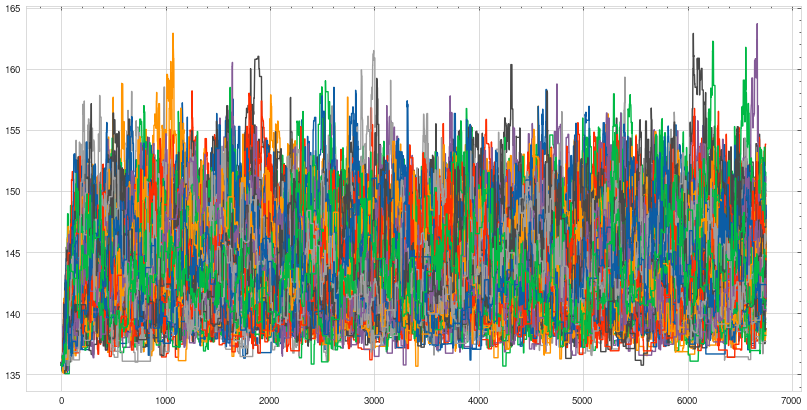

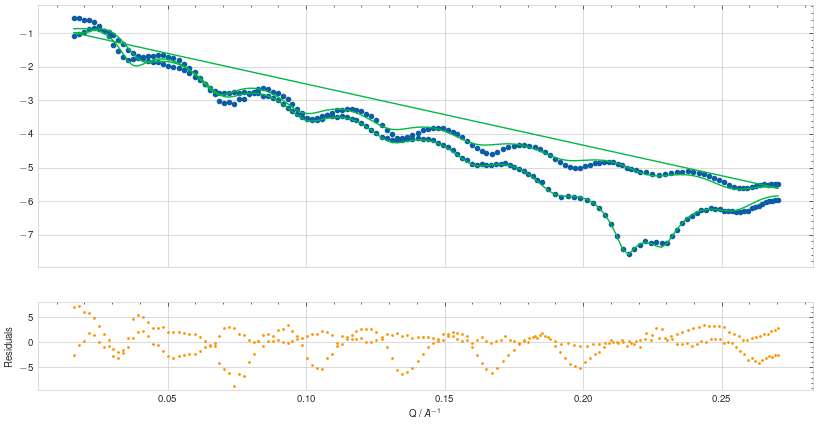

Fitting Surface | Ordered Bulk | Patern | Carbon | SiO2 | Si 284.2eV


100%|██████████| 5280/5280 [28:32<00:00,  3.08it/s] 


Reduced χ2 = 12.033615354554605


100%|██████████| 1320/1320 [09:01<00:00,  2.44it/s]


Reduced χ2 = 5.483243313857561
Red χ2 = 5.483243313857561. Refitting with 2x walkers


100%|██████████| 3960/3960 [23:23<00:00,  2.82it/s]


Reduced χ2 = 3.585021021558298
Red χ2 = 3.585021021558298. Refitting with 4x walkers


100%|██████████| 6600/6600 [38:56<00:00,  2.83it/s]


Reduced χ2 = 3.529341002514583
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=0.715006 +/- 0.00829, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=1.19924 +/- 0.000905, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.998327 +/- 0.00196, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.322467 +/- 0.0475, bounds=[-1.0, 1.0]>
<Parameter:'Surface_thick', value=4.64344 +/- 0.172, bounds=[0.0, 196.441]>
<Parameter: 'Surface_xx'  , value=3.68038e-05 +/- 4.75e-05, bounds=[-0.0033746016243625335, 0.0004122326602537805]>
<Parameter: 'Surface_ixx' , value=0.000201633 +/- 1.32e-05, bounds=[0.0001892297652180125, 0.005463794123048581]>
<Parameter: 'Surface_zz'  , value=0.000369197 +/- 4.65e-05, bounds=[-0.0033746016243625335, 0.0004122326602537805]>
<Parameter: 'Surface_izz' , value=0.00212633 +/- 5.83e-05, bounds=[0.0001892297652180125, 0.005463794123048581]>
<Parameter:'Surface_

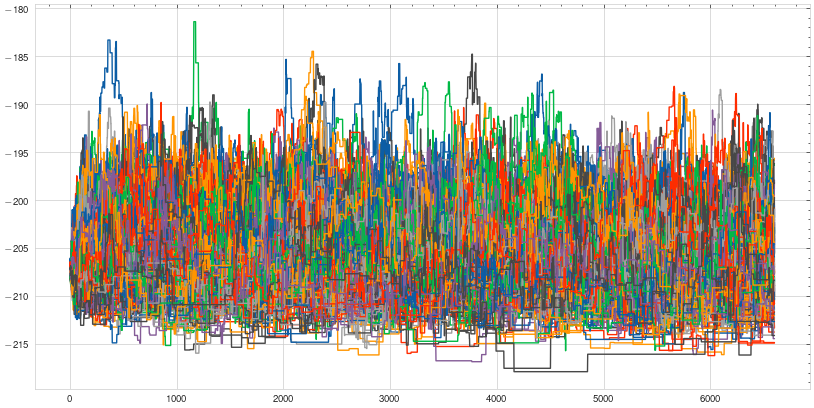

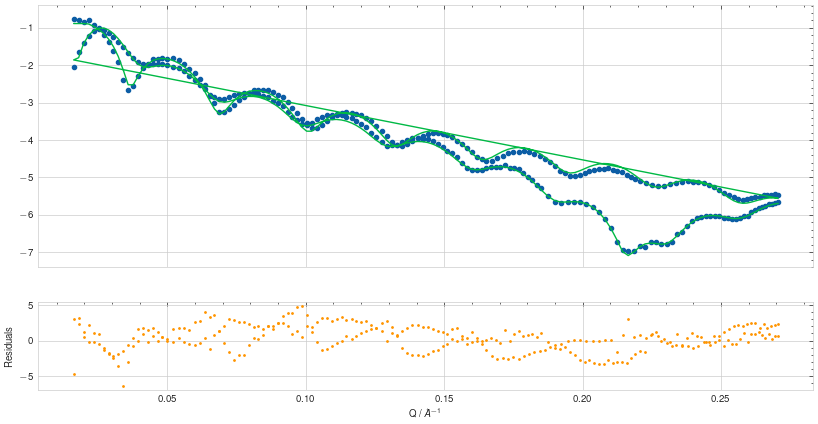

Fitting Surface | Ordered Bulk | Patern | Carbon | SiO2 | Si 287.0eV


100%|██████████| 4340/4340 [15:24<00:00,  4.69it/s]


Reduced χ2 = 227.7911421096405


100%|██████████| 1085/1085 [04:53<00:00,  3.70it/s]


Reduced χ2 = 68.30324264670324
Red χ2 = 68.30324264670324. Refitting with 2x walkers


100%|██████████| 3255/3255 [11:48<00:00,  4.59it/s]


Reduced χ2 = 12.819463843441486
Red χ2 = 12.819463843441486. Refitting with 4x walkers


100%|██████████| 5425/5425 [19:39<00:00,  4.60it/s]


Reduced χ2 = 8.047386870229966
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=1.19669 +/- 0.006, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=1.19543 +/- 0.00689, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.991021 +/- 0.0137, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.863542 +/- 0.0374, bounds=[-1.0, 1.0]>
<Parameter:'Surface_thick', value=15.0953 +/- 0.287, bounds=[0.0, 196.441]>
<Parameter: 'Surface_xx'  , value=0.00173857 +/- 3.26e-05, bounds=[-0.0003756707461118495, 0.0018735520635110115]>
<Parameter: 'Surface_ixx' , value=0.00425179 +/- 4.31e-05, bounds=[0.0008061165089359717, 0.00432164421038267]>
<Parameter: 'Surface_zz'  , value=0.00187074 +/- 4.78e-06, bounds=[-0.0003756707461118495, 0.0018735520635110115]>
<Parameter: 'Surface_izz' , value=0.0043171 +/- 7.91e-06, bounds=[0.0008061165089359717, 0.00432164421038267]>
<Parameter:'Surface_rough', val

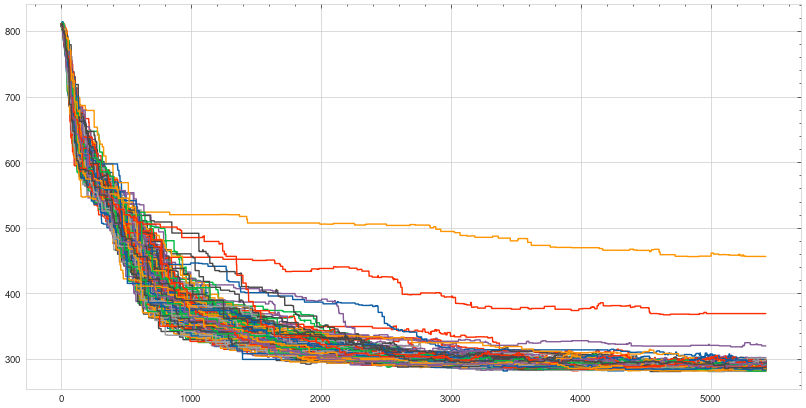

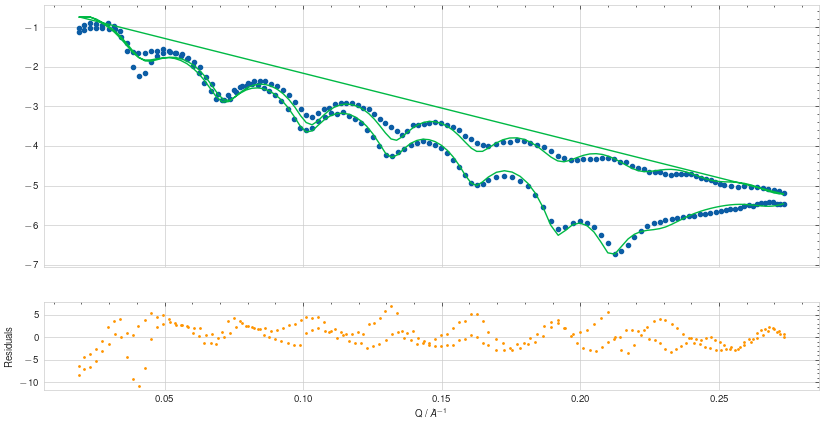

Fitting Surface | Ordered Bulk | Patern | Carbon | SiO2 | Si 289.0eV


100%|██████████| 4160/4160 [13:19<00:00,  5.21it/s]


Reduced χ2 = 169.8622619974115


100%|██████████| 1040/1040 [05:20<00:00,  3.25it/s]


Reduced χ2 = 25.19982589710942
Red χ2 = 25.19982589710942. Refitting with 2x walkers


100%|██████████| 3120/3120 [14:40<00:00,  3.54it/s]


Reduced χ2 = 16.51146012410227
Red χ2 = 16.51146012410227. Refitting with 4x walkers


100%|██████████| 5200/5200 [25:00<00:00,  3.47it/s]


Reduced χ2 = 15.946727547659249
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=0.961728 +/- 0.144, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=1.19824 +/- 0.00253, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.533063 +/- 0.162, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.38462 +/- 0.121, bounds=[-1.0, 1.0]>
<Parameter:'Surface_thick', value=14.4667 +/- 0.751, bounds=[0.0, 196.441]>
<Parameter: 'Surface_xx'  , value=0.00166258 +/- 4.3e-06, bounds=[-0.00035365442832559267, 0.0016652186443482488]>
<Parameter: 'Surface_ixx' , value=0.002349 +/- 0.000948, bounds=[0.0009895918732347158, 0.003619686422481791]>
<Parameter: 'Surface_zz'  , value=0.00120524 +/- 0.000295, bounds=[-0.00035365442832559267, 0.0016652186443482488]>
<Parameter: 'Surface_izz' , value=0.00319986 +/- 0.000767, bounds=[0.0009895918732347158, 0.003619686422481791]>
<Parameter:'Surface_rough', va

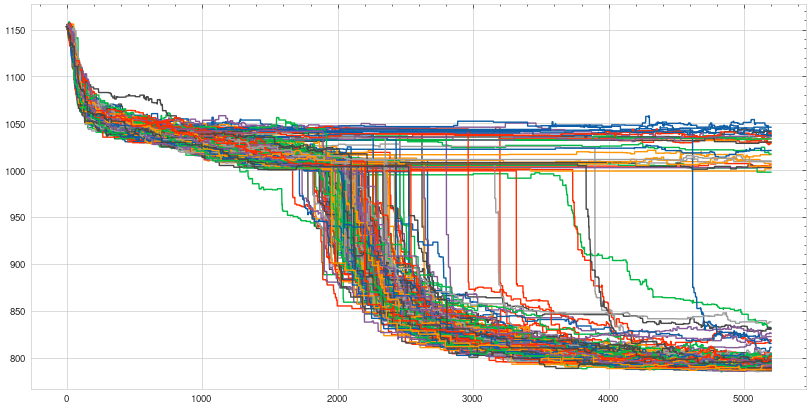

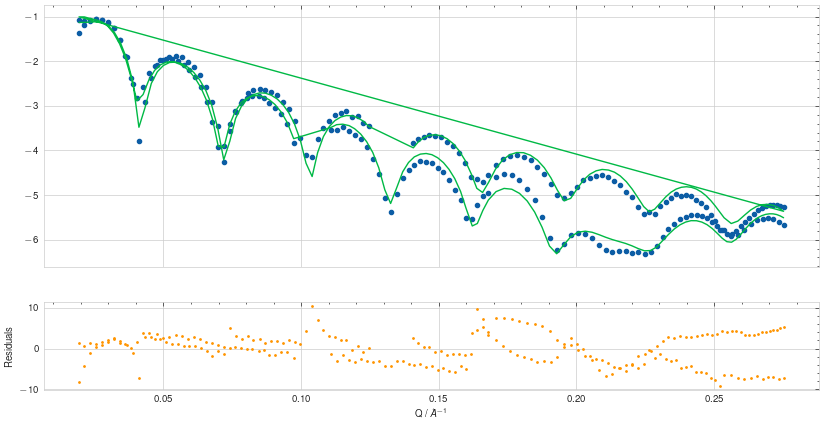

Fitting Surface | Ordered Bulk | Carbon (With Ordering) | SiO2 | Si 283.7eV


100%|██████████| 5160/5160 [24:23<00:00,  3.53it/s]


Reduced χ2 = 2.042519795308809


100%|██████████| 1290/1290 [07:36<00:00,  2.83it/s]


Reduced χ2 = 1.5970168713888933
Red χ2 = 1.5970168713888933. Refitting with 2x walkers


100%|██████████| 3870/3870 [20:29<00:00,  3.15it/s]


Reduced χ2 = 1.5089422337040228
Red χ2 = 1.5089422337040228. Refitting with 4x walkers


100%|██████████| 6450/6450 [33:32<00:00,  3.21it/s]


Reduced χ2 = 1.4532479607760445
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=0.939643 +/- 0.0257, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=1.05371 +/- 0.0304, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.966542 +/- 0.0326, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.585255 +/- 0.0494, bounds=[-1.0, 1.0]>
<Parameter:'Surface_thick', value=4.60634 +/- 0.632, bounds=[0.0, 196.441]>
<Parameter: 'Surface_xx'  , value=-9.63097e-08 +/- 5e-05, bounds=[-0.004487785909452915, 0.0004955200281860432]>
<Parameter: 'Surface_ixx' , value=0.000212276 +/- 8.32e-06, bounds=[0.00020494953411908198, 0.0011120068493401239]>
<Parameter: 'Surface_zz'  , value=-0.000482427 +/- 0.000125, bounds=[-0.004487785909452915, 0.0004955200281860432]>
<Parameter: 'Surface_izz' , value=0.000935814 +/- 9.14e-05, bounds=[0.00020494953411908198, 0.0011120068493401239]>
<Parameter:'Surface_r

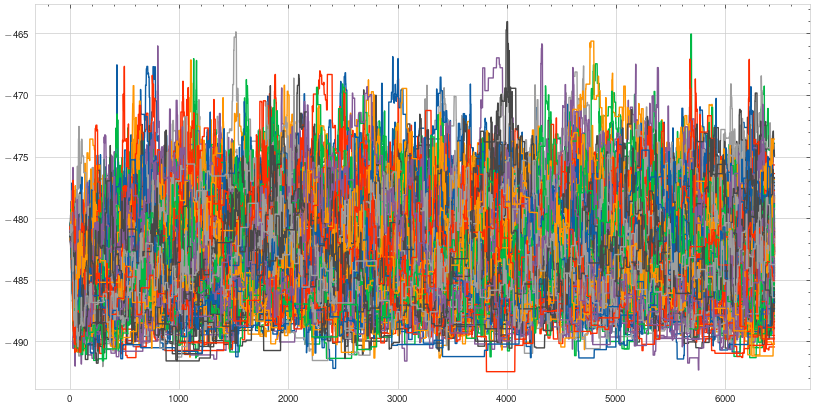

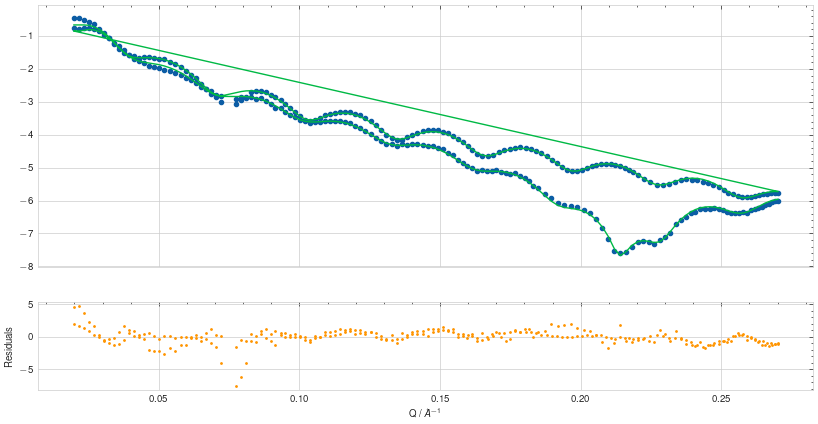

Fitting Surface | Ordered Bulk | Carbon (With Ordering) | SiO2 | Si 284.0eV


100%|██████████| 5400/5400 [28:44<00:00,  3.13it/s]


Reduced χ2 = 2.727544702169076


100%|██████████| 1350/1350 [07:59<00:00,  2.81it/s]


Reduced χ2 = 2.6767615843249177
Red χ2 = 2.6767615843249177. Refitting with 2x walkers


100%|██████████| 4050/4050 [23:44<00:00,  2.84it/s]


Reduced χ2 = 2.6755634016309733
Red χ2 = 2.6755634016309733. Refitting with 4x walkers


100%|██████████| 6750/6750 [39:39<00:00,  2.84it/s]


Reduced χ2 = 2.675766509642891
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=1.0542 +/- 0.0213, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=1.19204 +/- 0.00912, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.911912 +/- 0.0441, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.57088 +/- 0.0428, bounds=[-1.0, 1.0]>
<Parameter: 'Surface_xx'  , value=-0.000816743 +/- 7.3e-05, bounds=[-0.0050248435996135465, 0.00045075358544736704]>
<Parameter: 'Surface_ixx' , value=0.000702853 +/- 4.64e-05, bounds=[0.00019784191965667672, 0.004064021303685006]>
<Parameter: 'Surface_zz'  , value=-0.000149684 +/- 7.91e-05, bounds=[-0.0050248435996135465, 0.00045075358544736704]>
<Parameter: 'Surface_izz' , value=0.00134515 +/- 5.24e-05, bounds=[0.00019784191965667672, 0.004064021303685006]>
<Parameter:   'Bulk_xx'   , value=-0.00213939 +/- 7.15e-05, bounds=[-0.0050248435996135465, 0.000

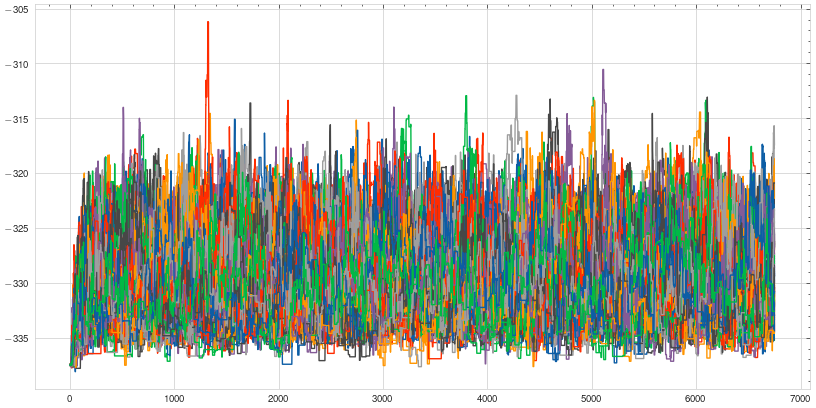

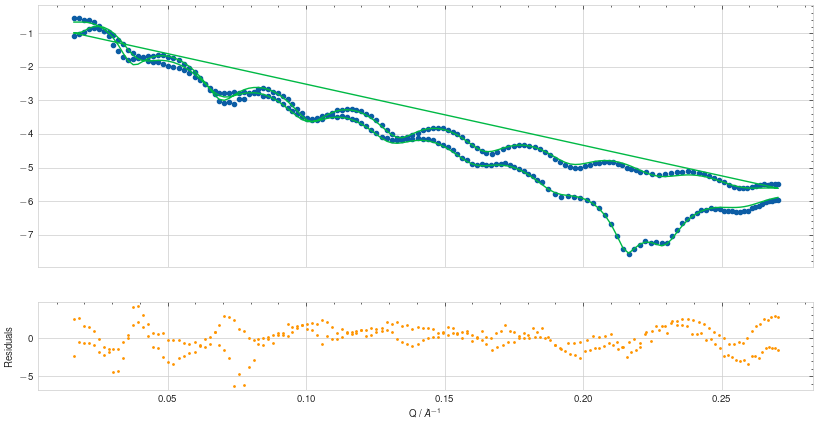

Fitting Surface | Ordered Bulk | Carbon (With Ordering) | SiO2 | Si 284.2eV


100%|██████████| 5320/5320 [22:03<00:00,  4.02it/s]


Reduced χ2 = 7.601751015120641


100%|██████████| 1330/1330 [07:02<00:00,  3.15it/s]


Reduced χ2 = 2.8769345602466023
Red χ2 = 2.8769345602466023. Refitting with 2x walkers


100%|██████████| 3990/3990 [20:51<00:00,  3.19it/s]


Reduced χ2 = 2.7063600566127484
Red χ2 = 2.7063600566127484. Refitting with 4x walkers


100%|██████████| 6650/6650 [34:31<00:00,  3.21it/s]


Reduced χ2 = 2.704247018753654
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=0.773445 +/- 0.0112, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=1.19795 +/- 0.00245, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.996286 +/- 0.00456, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.183519 +/- 0.0258, bounds=[-1.0, 1.0]>
<Parameter:'Surface_thick', value=4.44914 +/- 0.276, bounds=[0.0, 196.441]>
<Parameter: 'Surface_xx'  , value=-0.000101249 +/- 4.56e-05, bounds=[-0.0033746016243625335, 0.0004122326602537805]>
<Parameter: 'Surface_ixx' , value=0.000194566 +/- 6.17e-06, bounds=[0.0001892297652180125, 0.005463794123048581]>
<Parameter: 'Surface_zz'  , value=-9.12657e-05 +/- 0.000169, bounds=[-0.0033746016243625335, 0.0004122326602537805]>
<Parameter: 'Surface_izz' , value=0.00267034 +/- 0.000103, bounds=[0.0001892297652180125, 0.005463794123048581]>
<Parameter:'Surface_

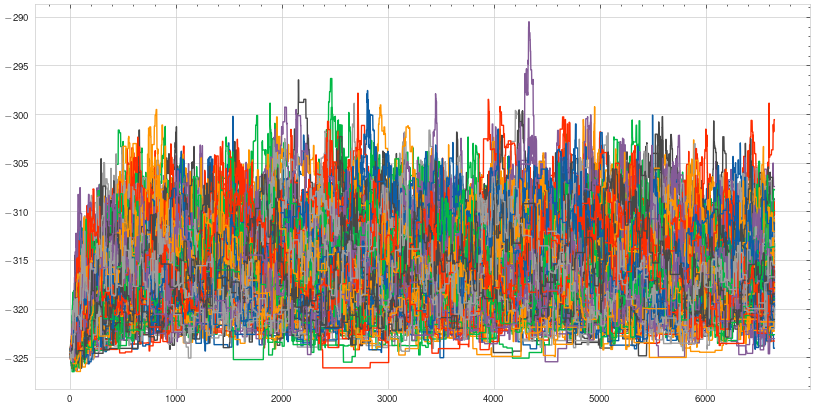

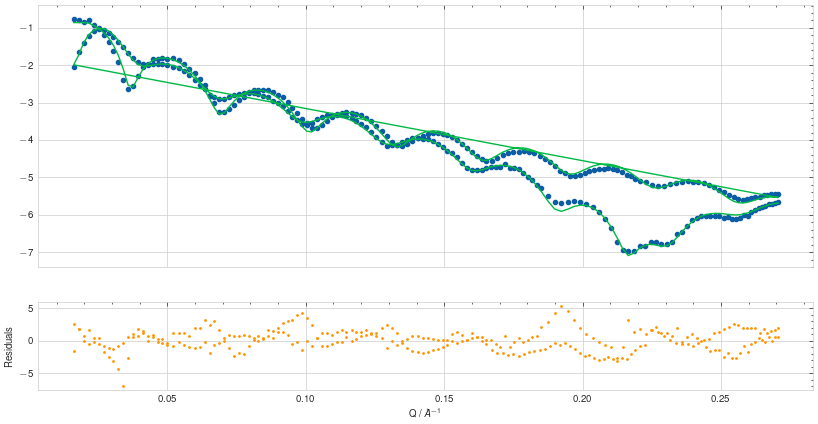

Fitting Surface | Ordered Bulk | Carbon (With Ordering) | SiO2 | Si 287.0eV


100%|██████████| 4380/4380 [13:48<00:00,  5.29it/s]


Reduced χ2 = 184.90322595966242


100%|██████████| 1095/1095 [03:40<00:00,  4.96it/s]


Reduced χ2 = 61.12537723972275
Red χ2 = 61.12537723972275. Refitting with 2x walkers


100%|██████████| 3285/3285 [09:35<00:00,  5.71it/s]


Reduced χ2 = 10.283762000392985
Red χ2 = 10.283762000392985. Refitting with 4x walkers


100%|██████████| 5475/5475 [17:43<00:00,  5.15it/s]


Reduced χ2 = 7.982287476643519
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=1.19832 +/- 0.00223, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=1.19779 +/- 0.00296, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.991392 +/- 0.00976, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.869601 +/- 0.0258, bounds=[-1.0, 1.0]>
<Parameter:'Surface_thick', value=15.7286 +/- 0.221, bounds=[0.0, 196.441]>
<Parameter: 'Surface_xx'  , value=0.00176053 +/- 2.2e-05, bounds=[-0.0003756707461118495, 0.0018735520635110115]>
<Parameter: 'Surface_ixx' , value=0.00421914 +/- 3.88e-05, bounds=[0.0008061165089359717, 0.00432164421038267]>
<Parameter: 'Surface_zz'  , value=0.00187187 +/- 2.37e-06, bounds=[-0.0003756707461118495, 0.0018735520635110115]>
<Parameter: 'Surface_izz' , value=0.00431928 +/- 3.14e-06, bounds=[0.0008061165089359717, 0.00432164421038267]>
<Parameter:'Surface_rough', 

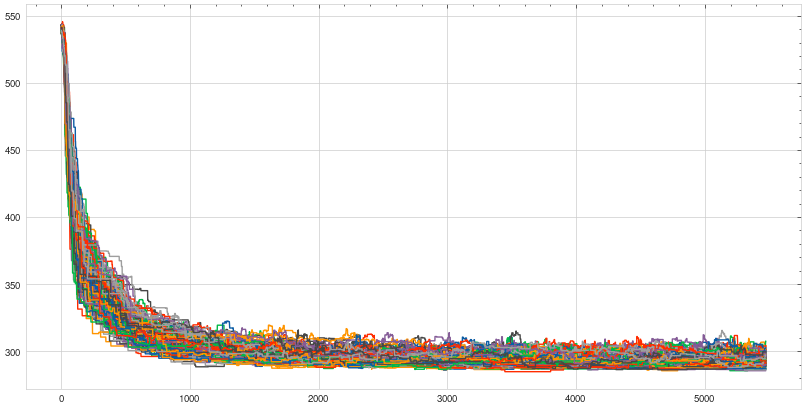

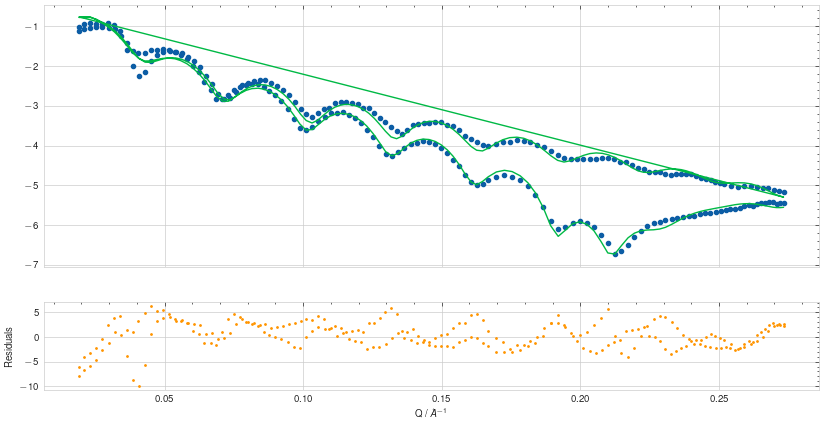

Fitting Surface | Ordered Bulk | Carbon (With Ordering) | SiO2 | Si 289.0eV


100%|██████████| 4200/4200 [10:49<00:00,  6.46it/s]


Reduced χ2 = 88.50063211391344


100%|██████████| 1050/1050 [04:20<00:00,  4.04it/s]


Reduced χ2 = 23.662800476229513
Red χ2 = 23.662800476229513. Refitting with 2x walkers


100%|██████████| 3150/3150 [13:53<00:00,  3.78it/s]


Reduced χ2 = 18.173184673023368
Red χ2 = 18.173184673023368. Refitting with 4x walkers


100%|██████████| 5250/5250 [23:07<00:00,  3.78it/s]


Reduced χ2 = 18.135724401561976
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=1.08381 +/- 0.011, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=1.19939 +/- 0.00073, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.582419 +/- 0.0051, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.371384 +/- 0.0143, bounds=[-1.0, 1.0]>
<Parameter:'Surface_thick', value=13.0905 +/- 0.198, bounds=[0.0, 196.441]>
<Parameter: 'Surface_xx'  , value=0.00100845 +/- 4.41e-05, bounds=[-0.00035365442832559267, 0.0016652186443482488]>
<Parameter: 'Surface_ixx' , value=0.00196506 +/- 3.36e-05, bounds=[0.0009895918732347158, 0.003619686422481791]>
<Parameter: 'Surface_zz'  , value=0.00138074 +/- 6.12e-05, bounds=[-0.00035365442832559267, 0.0016652186443482488]>
<Parameter: 'Surface_izz' , value=0.00357477 +/- 4.36e-05, bounds=[0.0009895918732347158, 0.003619686422481791]>
<Parameter:'Surface_rough

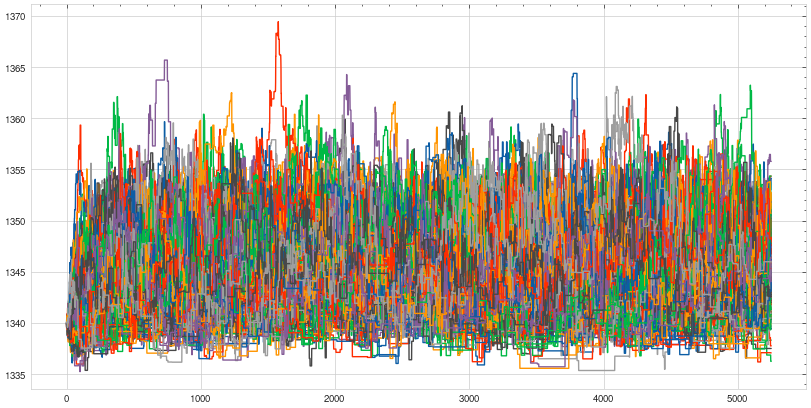

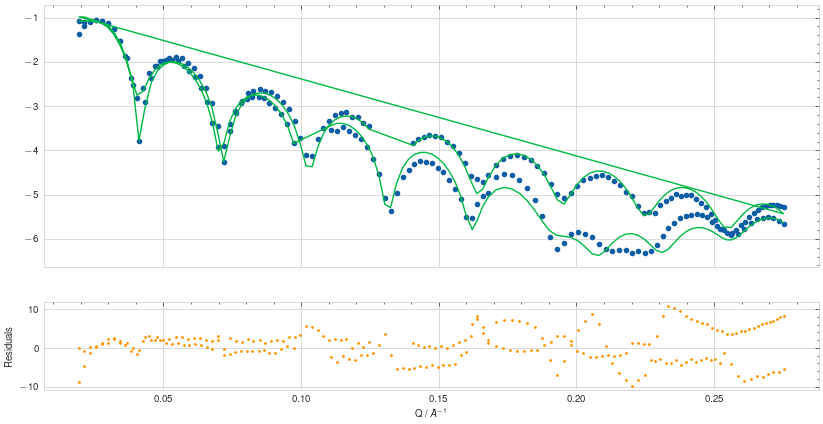

Fitting Surface | Ordered Bulk | Carbon | SiO2 | Si 283.7eV


100%|██████████| 5240/5240 [21:35<00:00,  4.05it/s]


Reduced χ2 = 6.918057918866205


100%|██████████| 1310/1310 [06:55<00:00,  3.15it/s]


Reduced χ2 = 4.412400330007985
Red χ2 = 4.412400330007985. Refitting with 2x walkers


100%|██████████| 3930/3930 [19:30<00:00,  3.36it/s]


Reduced χ2 = 3.6572798529716666
Red χ2 = 3.6572798529716666. Refitting with 4x walkers


100%|██████████| 6550/6550 [31:59<00:00,  3.41it/s]


Reduced χ2 = 3.655385637031901
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=0.702649 +/- 0.0185, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=0.928116 +/- 0.0205, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.957571 +/- 0.0339, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.985387 +/- 0.0171, bounds=[-1.0, 1.0]>
<Parameter:'Surface_thick', value=7.11725 +/- 0.27 , bounds=[0.0, 196.441]>
<Parameter: 'Surface_xx'  , value=-0.00117376 +/- 5.79e-05, bounds=[-0.004487785909452915, 0.0004955200281860432]>
<Parameter: 'Surface_ixx' , value=0.000349439 +/- 8.22e-05, bounds=[0.00020494953411908198, 0.0011120068493401239]>
<Parameter: 'Surface_zz'  , value=-0.00182415 +/- 6.85e-05, bounds=[-0.004487785909452915, 0.0004955200281860432]>
<Parameter: 'Surface_izz' , value=0.000445274 +/- 0.000114, bounds=[0.00020494953411908198, 0.0011120068493401239]>
<Parameter:'Surface_

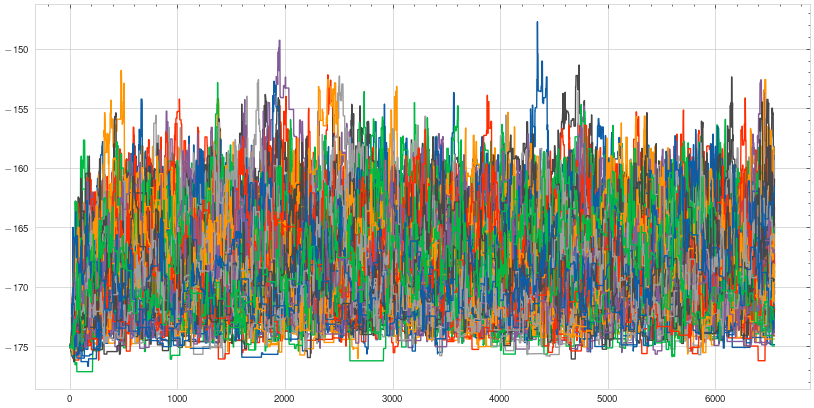

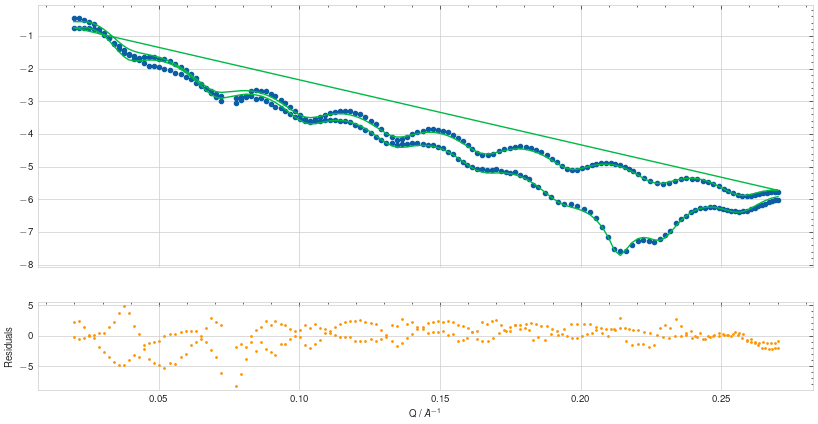

Fitting Surface | Ordered Bulk | Carbon | SiO2 | Si 284.0eV


100%|██████████| 5480/5480 [21:27<00:00,  4.26it/s]


Reduced χ2 = 11.54410257905522


100%|██████████| 1370/1370 [05:45<00:00,  3.96it/s]


Reduced χ2 = 11.5322327336561
Red χ2 = 11.5322327336561. Refitting with 2x walkers


100%|██████████| 4110/4110 [17:08<00:00,  4.00it/s]


Reduced χ2 = 11.532323319227784
Red χ2 = 11.532323319227784. Refitting with 4x walkers


100%|██████████| 6850/6850 [28:24<00:00,  4.02it/s]


Reduced χ2 = 11.53207581271349
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=0.667523 +/- 0.00767, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=0.804839 +/- 0.0105, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.404147 +/- 0.0303, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.999224 +/- 0.000931, bounds=[-1.0, 1.0]>
<Parameter: 'Surface_xx'  , value=0.000340433 +/- 4.78e-05, bounds=[-0.0050248435996135465, 0.00045075358544736704]>
<Parameter: 'Surface_ixx' , value=0.00020488 +/- 8.19e-06, bounds=[0.00019784191965667672, 0.004064021303685006]>
<Parameter: 'Surface_zz'  , value=-0.00129465 +/- 5.62e-05, bounds=[-0.0050248435996135465, 0.00045075358544736704]>
<Parameter: 'Surface_izz' , value=0.000773565 +/- 5e-05, bounds=[0.00019784191965667672, 0.004064021303685006]>
<Parameter:   'Bulk_xx'   , value=-0.00164349 +/- 3.43e-05, bounds=[-0.0050248435996135465, 0.0

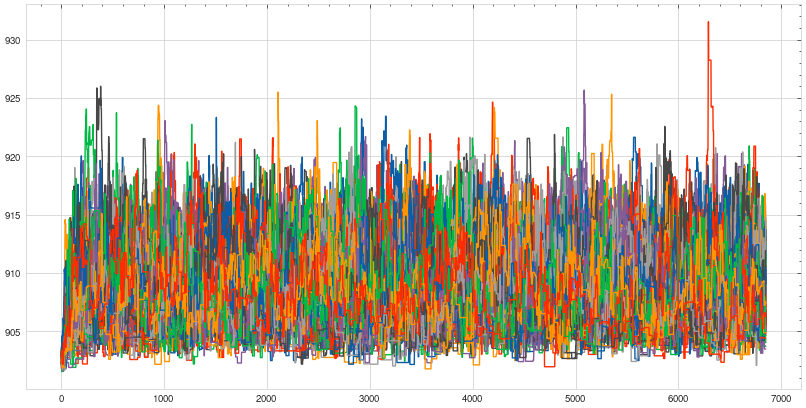

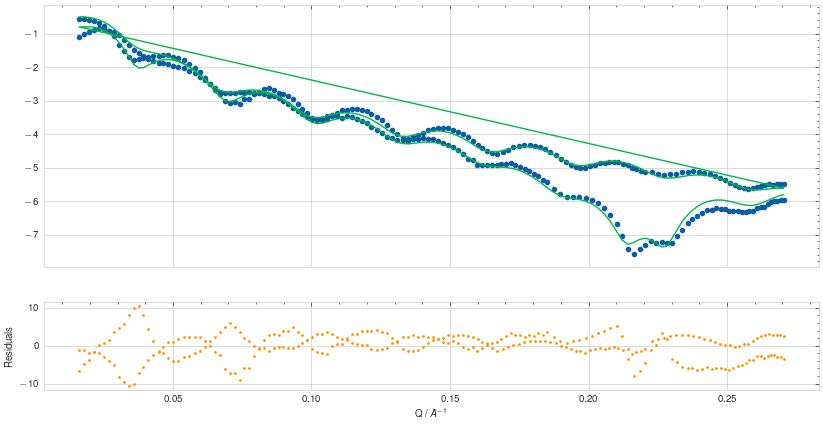

Fitting Surface | Ordered Bulk | Carbon | SiO2 | Si 284.2eV


100%|██████████| 5400/5400 [22:54<00:00,  3.93it/s]


Reduced χ2 = 10.087484189286036


100%|██████████| 1350/1350 [06:28<00:00,  3.48it/s]


Reduced χ2 = 10.006254514532197
Red χ2 = 10.006254514532197. Refitting with 2x walkers


100%|██████████| 4050/4050 [19:07<00:00,  3.53it/s]


Reduced χ2 = 10.000149109557485
Red χ2 = 10.000149109557485. Refitting with 4x walkers


100%|██████████| 6750/6750 [31:26<00:00,  3.58it/s]


Reduced χ2 = 9.999596604747639
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=0.722761 +/- 0.00636, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=1.1995 +/- 0.000598, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.998635 +/- 0.00168, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.888048 +/- 0.0282, bounds=[-1.0, 1.0]>
<Parameter:'Surface_thick', value=4.3303 +/- 0.171, bounds=[0.0, 196.441]>
<Parameter: 'Surface_xx'  , value=-0.000579828 +/- 4.49e-05, bounds=[-0.0033746016243625335, 0.0004122326602537805]>
<Parameter: 'Surface_ixx' , value=0.000201074 +/- 1.26e-05, bounds=[0.0001892297652180125, 0.005463794123048581]>
<Parameter: 'Surface_zz'  , value=-0.00137835 +/- 8.91e-05, bounds=[-0.0033746016243625335, 0.0004122326602537805]>
<Parameter: 'Surface_izz' , value=0.0018569 +/- 5.44e-05, bounds=[0.0001892297652180125, 0.005463794123048581]>
<Parameter:'Surface_ro

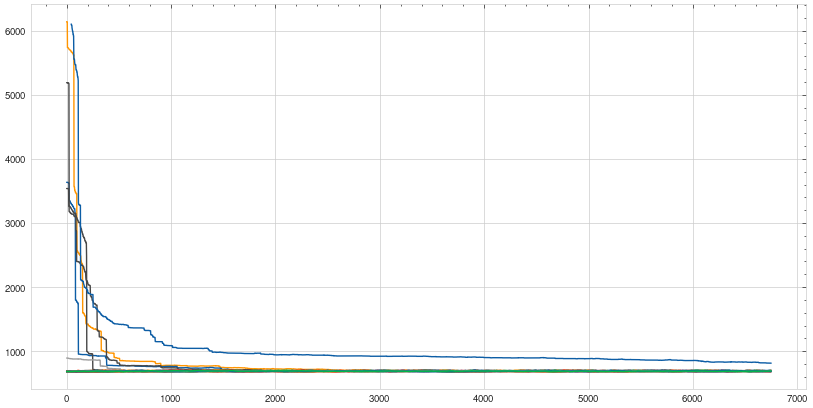

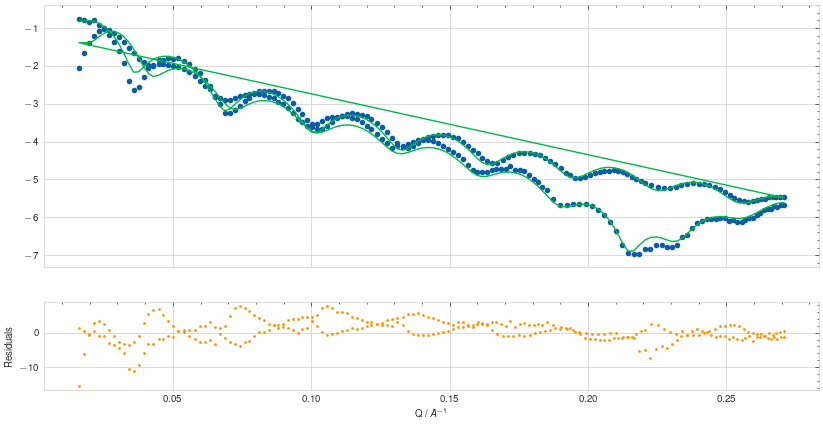

Fitting Surface | Ordered Bulk | Carbon | SiO2 | Si 287.0eV


100%|██████████| 4460/4460 [11:07<00:00,  6.68it/s]


Reduced χ2 = 27.739059974055756


100%|██████████| 1115/1115 [03:31<00:00,  5.26it/s]


Reduced χ2 = 20.00867377134739
Red χ2 = 20.00867377134739. Refitting with 2x walkers


100%|██████████| 3345/3345 [10:07<00:00,  5.51it/s]


Reduced χ2 = 19.39990510022405
Red χ2 = 19.39990510022405. Refitting with 4x walkers


100%|██████████| 5575/5575 [16:48<00:00,  5.53it/s]


Reduced χ2 = 19.38881948415253
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=1.19904 +/- 0.00115, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=1.19939 +/- 0.000737, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.902816 +/- 0.00889, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.82627 +/- 0.00979, bounds=[-1.0, 1.0]>
<Parameter:'Surface_thick', value=20.3295 +/- 0.0789, bounds=[0.0, 196.441]>
<Parameter: 'Surface_xx'  , value=0.001869 +/- 5.29e-06, bounds=[-0.0003756707461118495, 0.0018735520635110115]>
<Parameter: 'Surface_ixx' , value=0.00431636 +/- 5.74e-06, bounds=[0.0008061165089359717, 0.00432164421038267]>
<Parameter: 'Surface_zz'  , value=0.00104298 +/- 1.87e-05, bounds=[-0.0003756707461118495, 0.0018735520635110115]>
<Parameter: 'Surface_izz' , value=0.00432091 +/- 9.1e-07, bounds=[0.0008061165089359717, 0.00432164421038267]>
<Parameter:'Surface_rough', 

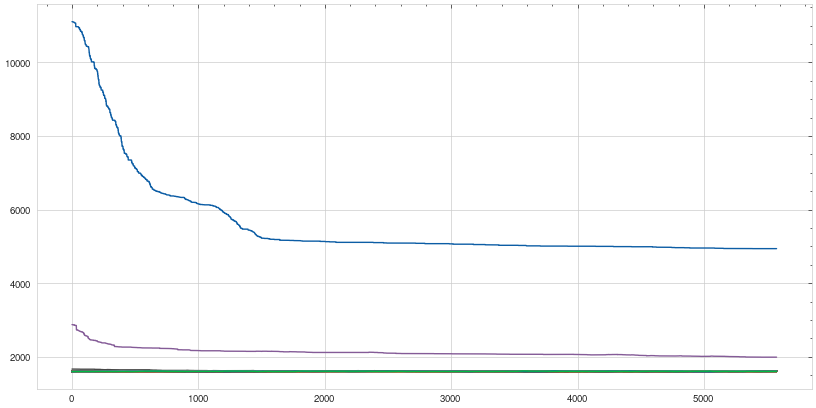

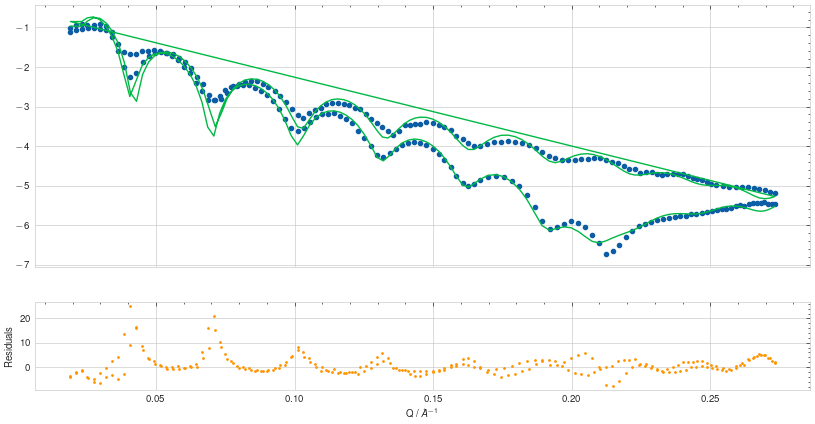

Fitting Surface | Ordered Bulk | Carbon | SiO2 | Si 289.0eV


100%|██████████| 4280/4280 [13:22<00:00,  5.33it/s]


Reduced χ2 = 22.94535675134876


100%|██████████| 1070/1070 [04:50<00:00,  3.68it/s]


Reduced χ2 = 12.550092085816384
Red χ2 = 12.550092085816384. Refitting with 2x walkers


100%|██████████| 3210/3210 [14:52<00:00,  3.60it/s]


Reduced χ2 = 12.417676845818827
Red χ2 = 12.417676845818827. Refitting with 4x walkers


100%|██████████| 5350/5350 [24:27<00:00,  3.64it/s]


Reduced χ2 = 12.416595877739175
________________________________________________________________________________
Parameters:      None      
<Parameter:   'scale_s'   , value=0.667348 +/- 0.0118, bounds=[0.6, 1.2]>
<Parameter:   'scale_p'   , value=1.05452 +/- 0.0196, bounds=[0.6, 1.2]>
<Parameter:'theta_offset_s', value=-0.734386 +/- 0.0119, bounds=[-1.0, 1.0]>
<Parameter:'theta_offset_p', value=-0.77278 +/- 0.0111, bounds=[-1.0, 1.0]>
<Parameter:'Surface_thick', value=18.2098 +/- 0.153, bounds=[0.0, 196.441]>
<Parameter: 'Surface_xx'  , value=0.00164936 +/- 1.8e-05, bounds=[-0.00035365442832559267, 0.0016652186443482488]>
<Parameter: 'Surface_ixx' , value=0.00360555 +/- 1.56e-05, bounds=[0.0009895918732347158, 0.003619686422481791]>
<Parameter: 'Surface_zz'  , value=0.000378783 +/- 2.74e-05, bounds=[-0.00035365442832559267, 0.0016652186443482488]>
<Parameter: 'Surface_izz' , value=0.00350938 +/- 2.43e-05, bounds=[0.0009895918732347158, 0.003619686422481791]>
<Parameter:'Surface_rough

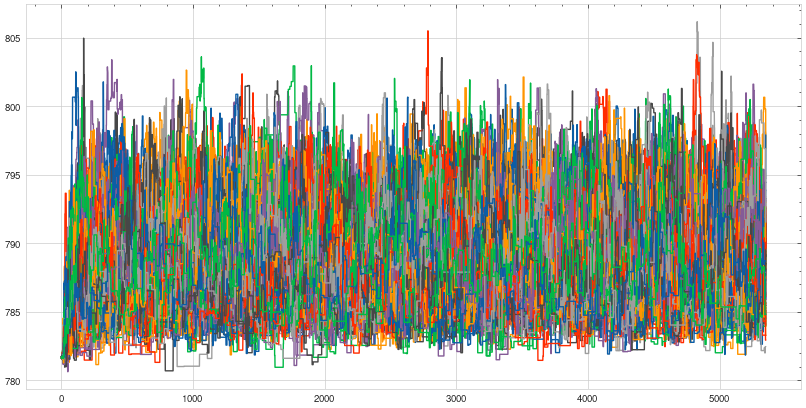

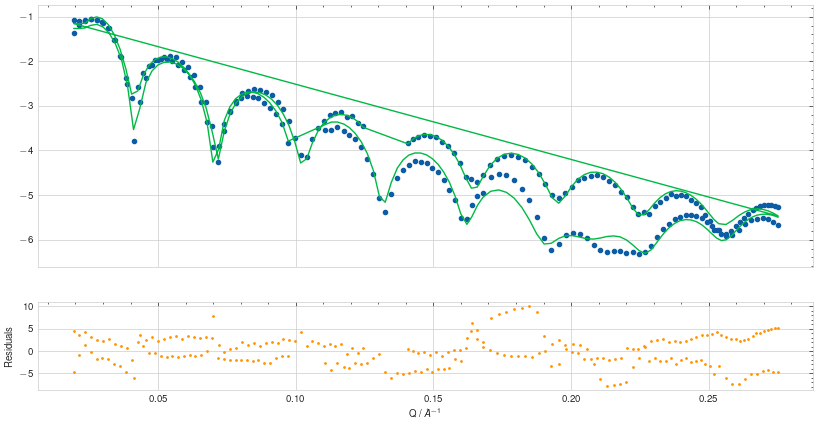

In [23]:
for i, list_obj in enumerate(obj_list):
    fitter = MultiEnFitter(list_obj, en)
    fitter.fit()

True
True
True
False
True
True
True
True
False
True
False
False
True
False
True


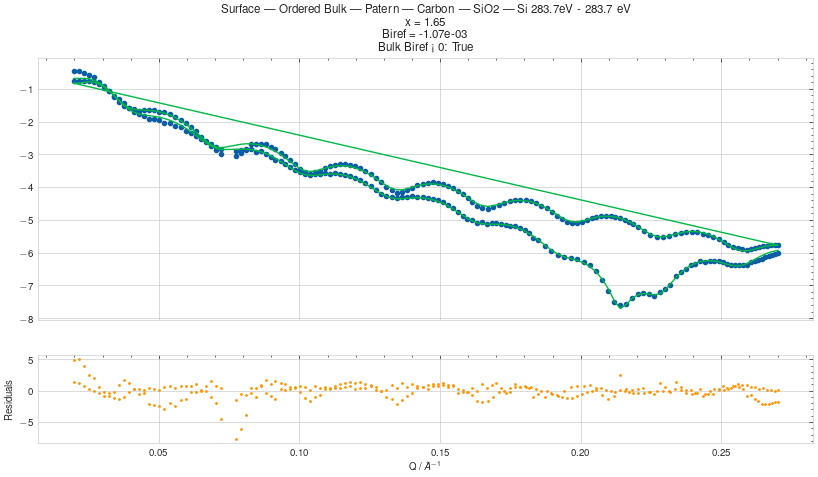

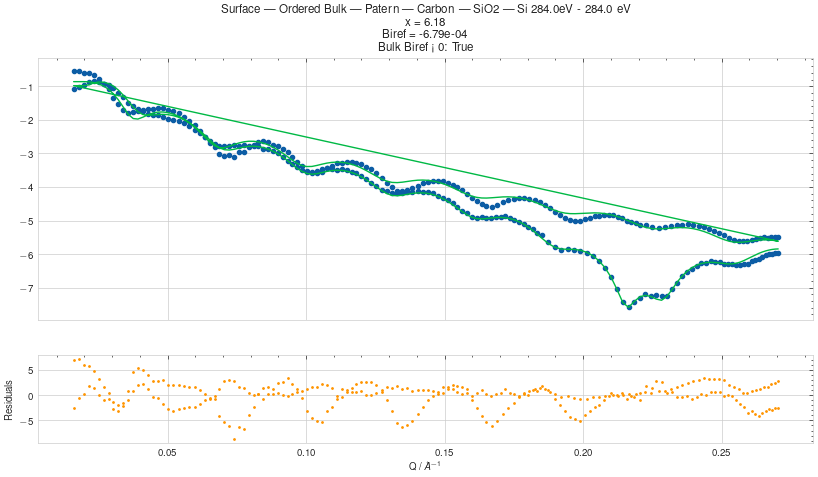

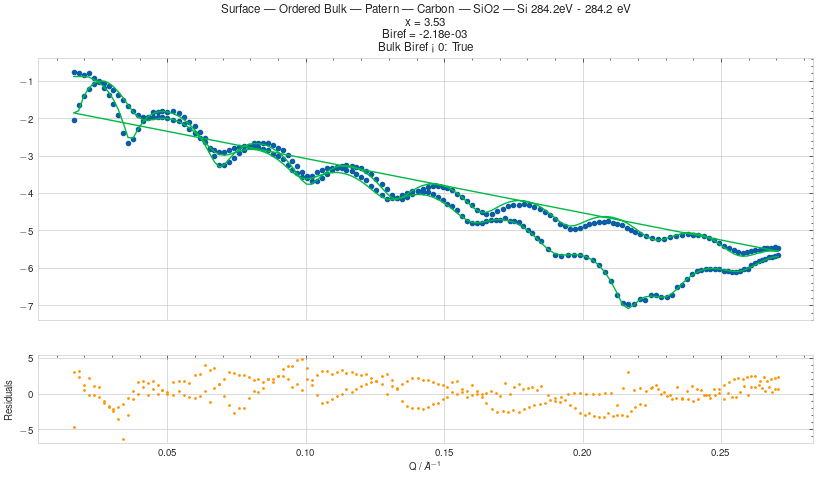

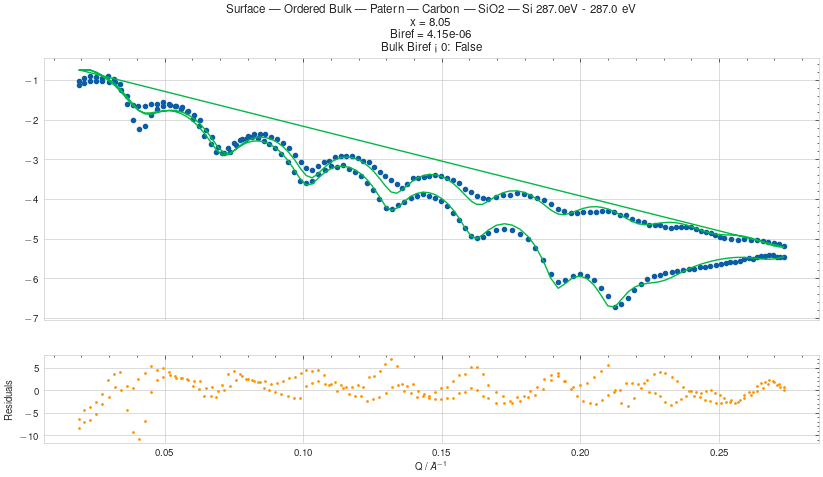

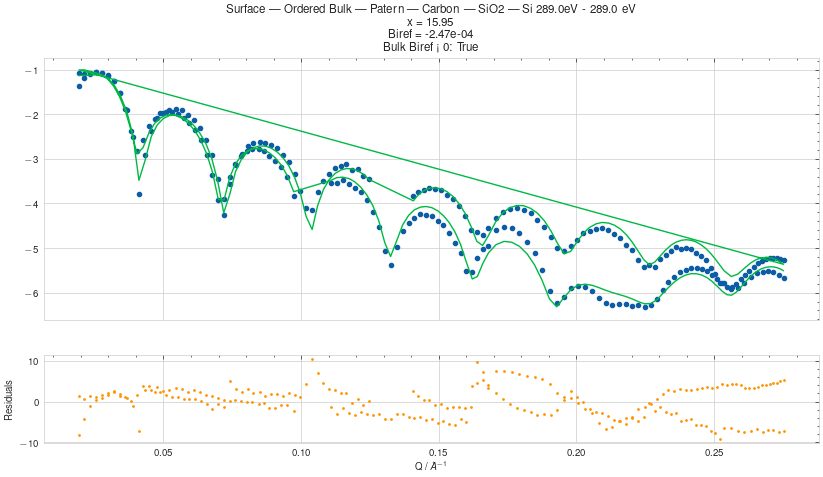

...

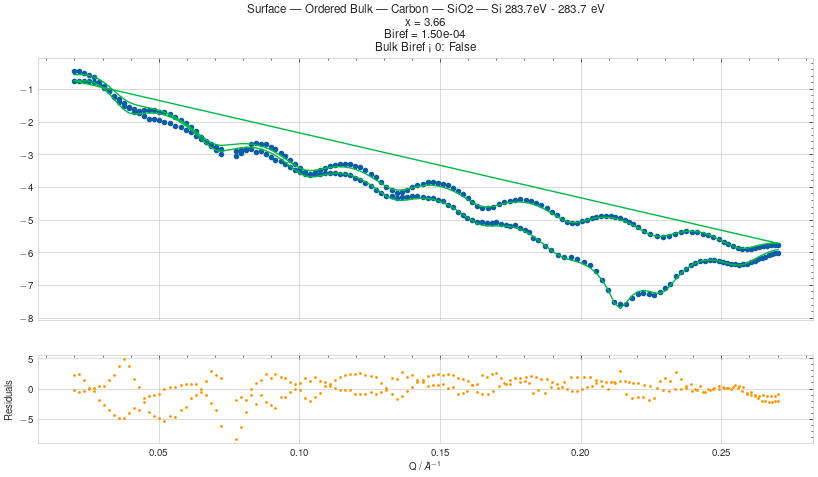

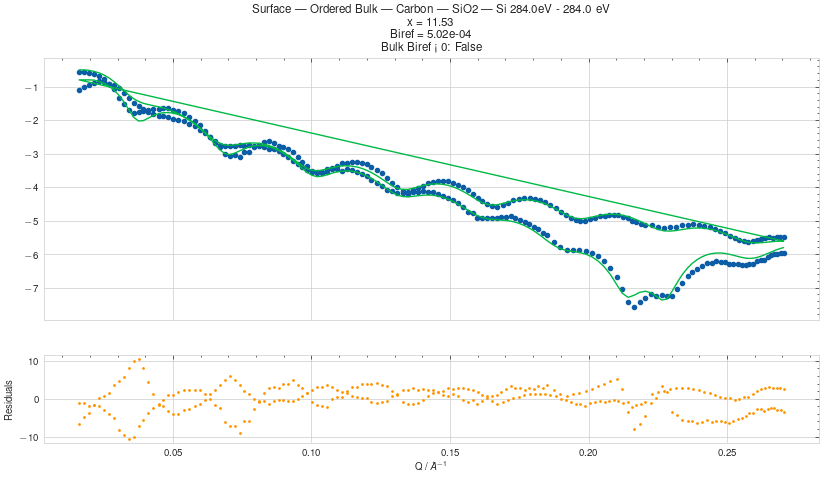

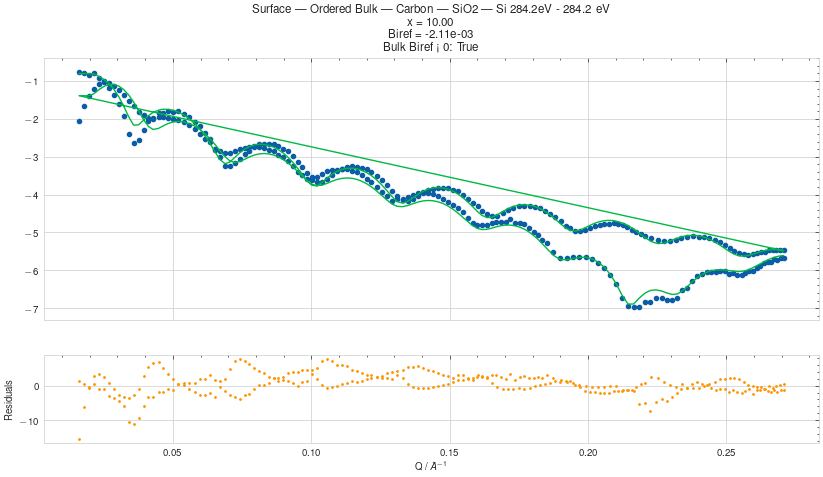

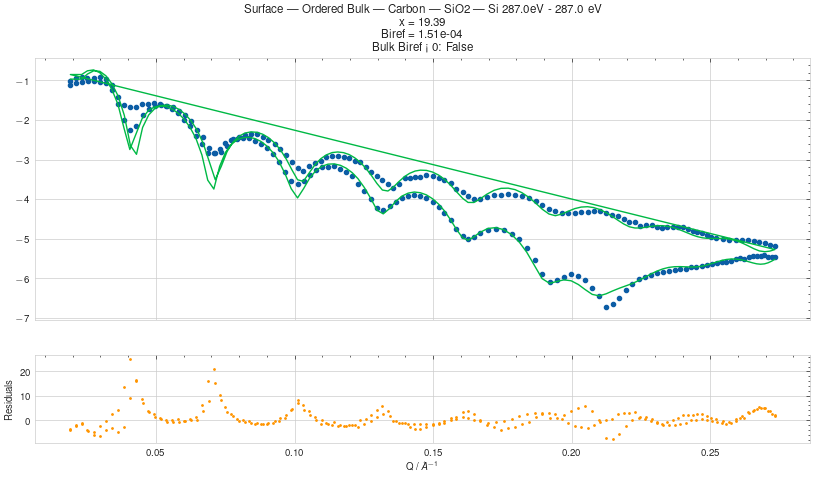

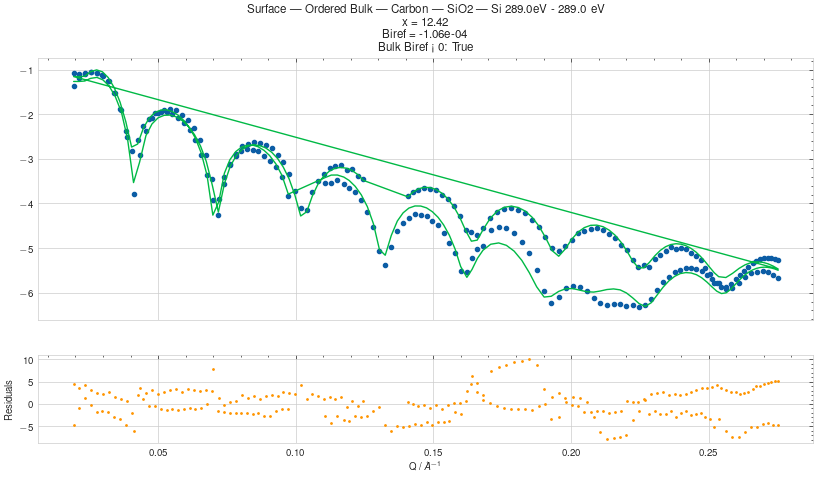

In [26]:

bulk_index = [2, 2, 2]
dfs = []
for i, ob in enumerate(obj_list):
    for j in range(len(en)):
        objective = ob[j]
        chi_sqr = objective.chisqr() / (len(objective.data.data[0]) - len(objective.varying_parameters()))
        bulk = objective.model.structure[bulk_index[i]]
        bulk_biref = bulk.sld.xx.value - bulk.sld.zz.value
        print(True if bulk_biref < 0 else False)
        row = pd.DataFrame(
            {
                "Energy": en[j],
                "Structure": i+1,
                "Chisqr": chi_sqr,
                "Bulk Biref": bulk_biref,
                "Structure Name": _s[i],
            },
            index = [0]
        )
        dfs.append(row)
        fig, ax = objective.plot(resid=True)
        ax.set_title(f"{objective.name} - {en[j]} eV \n x = {chi_sqr:.2f} \n Biref = {bulk_biref:.2e} \n Bulk Biref < 0: {True if bulk_biref < 0 else False}")

df = pd.concat(dfs)


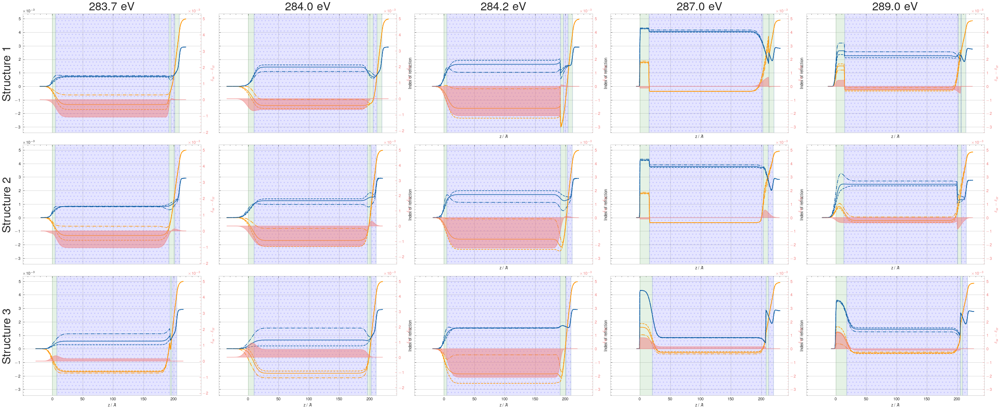

In [27]:
show_comparison()

[Text(0.5, 1.0, 'Bulk Biref'),
 Text(0.5, 0, 'Structure'),
 Text(0, 0.5, 'Biref')]

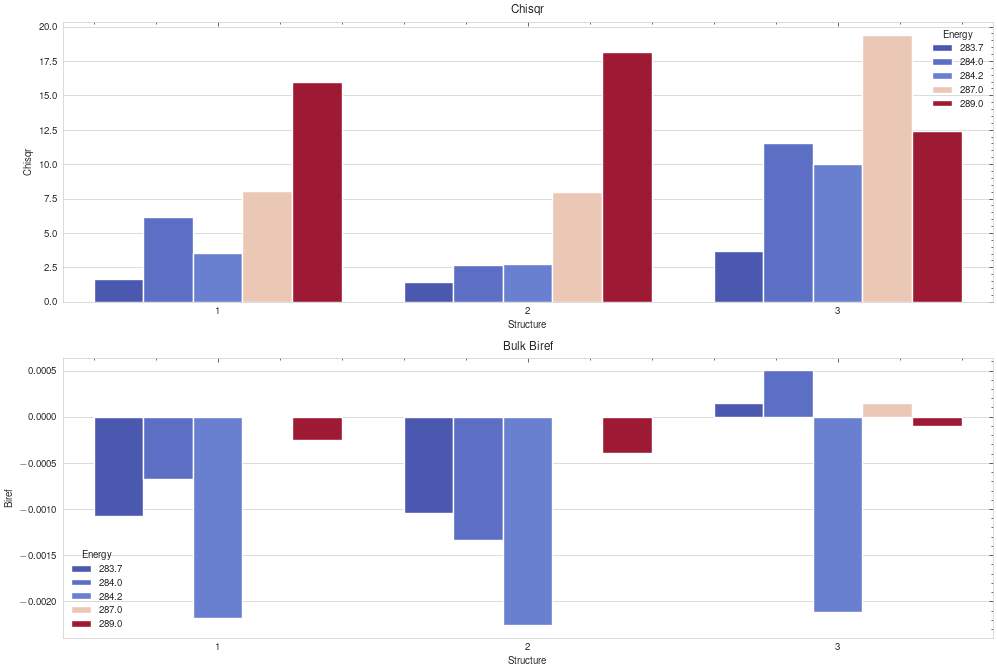

In [29]:
import seaborn as sns

fig, ax = plt.subplots(figsize = (12, 8), nrows = 2)
sns.barplot(data = df, x = "Structure", y = "Chisqr", hue = "Energy", palette = "coolwarm", ax = ax[0])
sns.barplot(data = df, x = "Structure", y = "Bulk Biref", hue = "Energy", palette = "coolwarm", ax = ax[1])
ax[0].set(
    title = "Chisqr",
    xlabel = "Structure",
    ylabel = "Chisqr",
)
ax[1].set(
    title = "Bulk Biref",
    xlabel = "Structure",
    ylabel = "Biref"
)

In [30]:
def save_optical_constant(energy: float, slab: None | PXR_Slab = None, oc_df: pd.Series | None = None) -> pd.Series:
    if oc_df is None:
        oc_df = pd.Series(index=[
            "xx",
            "zz",
            "dxx",
            "dzz",
            "delta",
            "ddelta",
            "ixx",
            "izz",
            "dixx",
            "dizz",
            "beta",
            "dbeta",
            "energy"])
    if slab is None:
        return oc_df
    else:
        oc_df["xx"] = slab.sld.xx.value
        oc_df["zz"] = slab.sld.zz.value
        oc_df["dxx"] = slab.sld.xx.stderr
        oc_df["dzz"] = slab.sld.zz.stderr
        oc_df["delta"] = slab.sld.delta.value
        oc_df["ddelta"] = slab.sld.delta.stderr
        oc_df["ixx"] = slab.sld.ixx.value
        oc_df["izz"] = slab.sld.izz.value
        oc_df["dixx"] = slab.sld.ixx.stderr
        oc_df["dizz"] = slab.sld.izz.stderr
        oc_df["beta"] = slab.sld.beta.value
        oc_df["dbeta"] = slab.sld.beta.stderr
        oc_df["energy"] = energy
        return oc_df

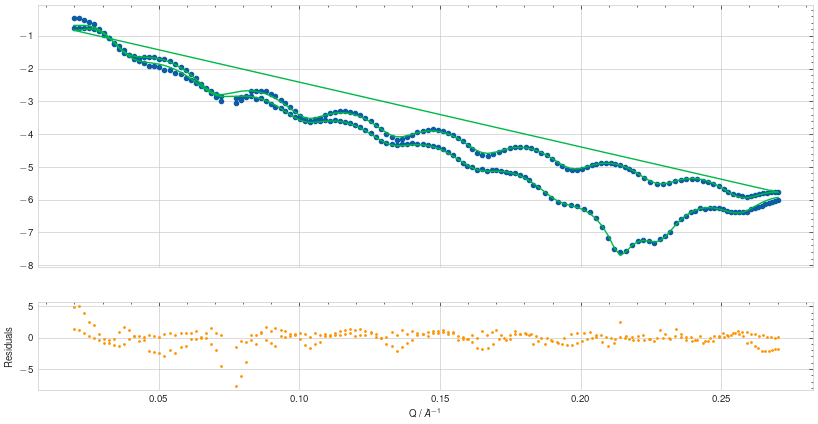

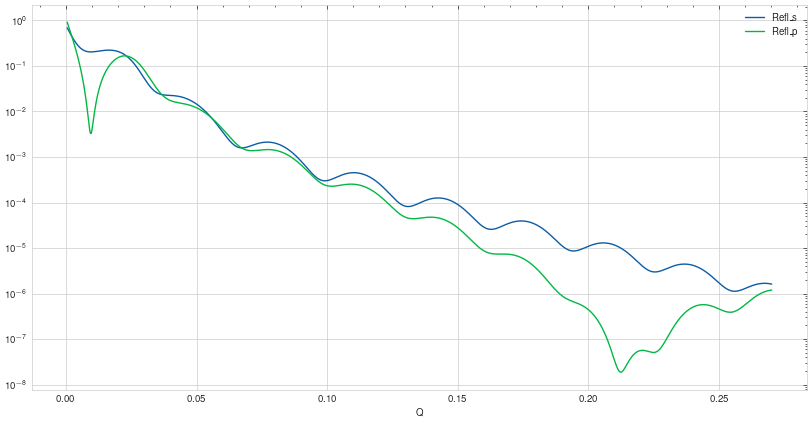

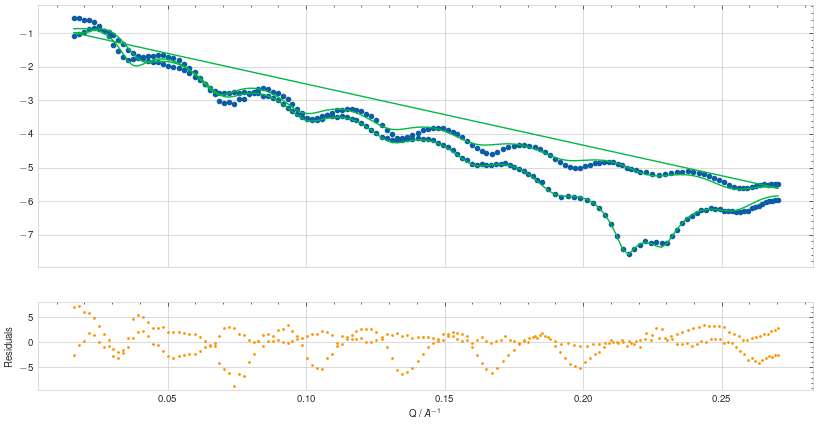

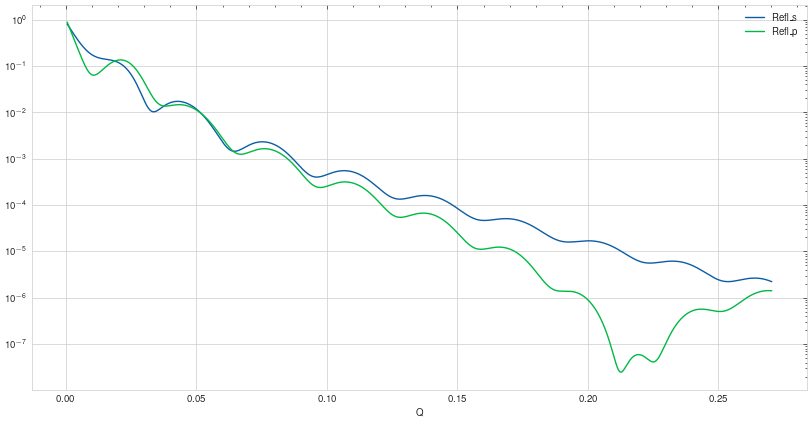

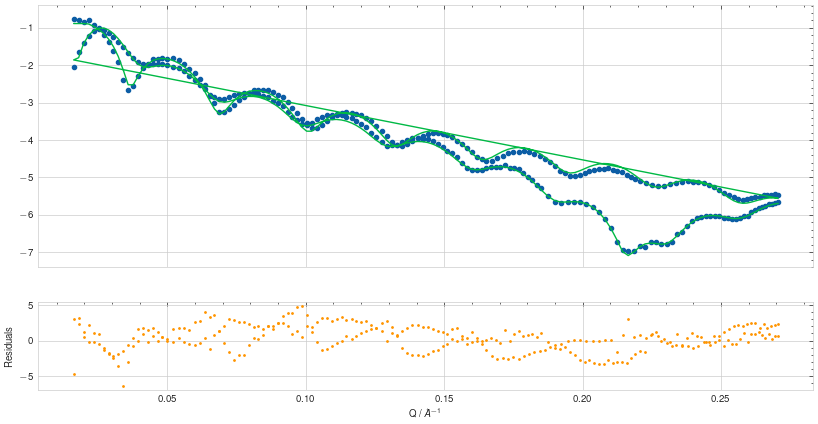

...

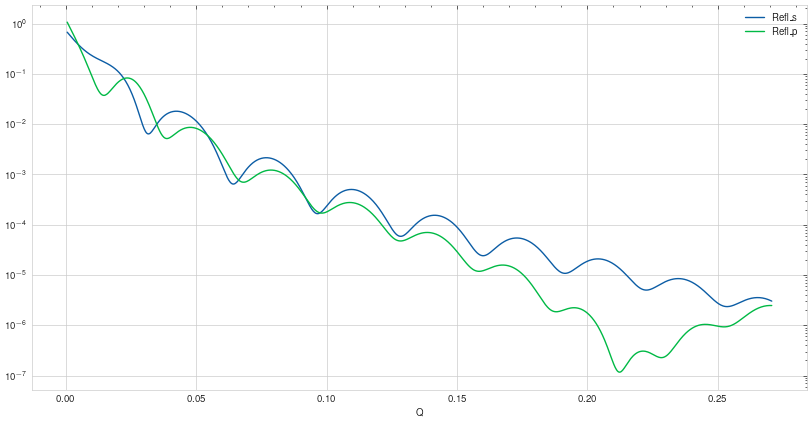

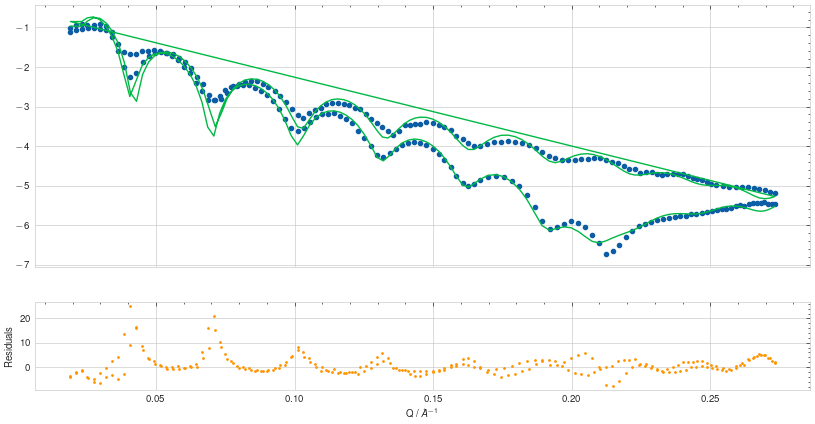

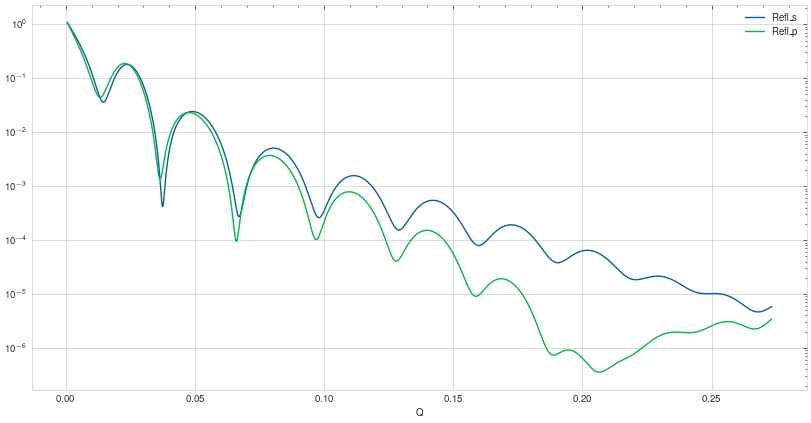

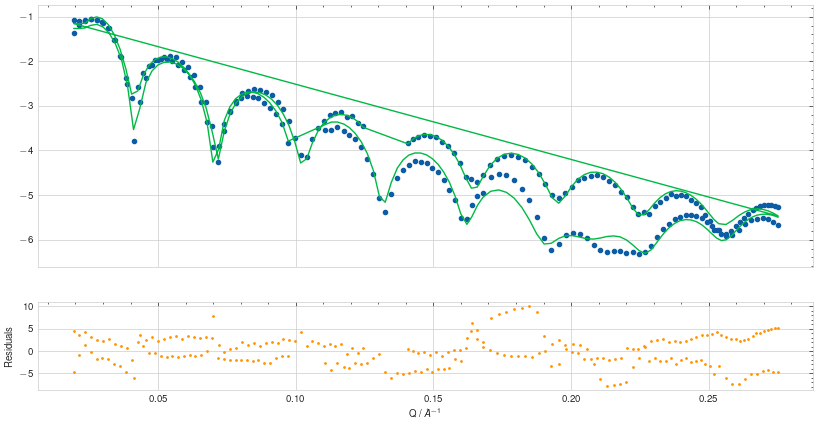

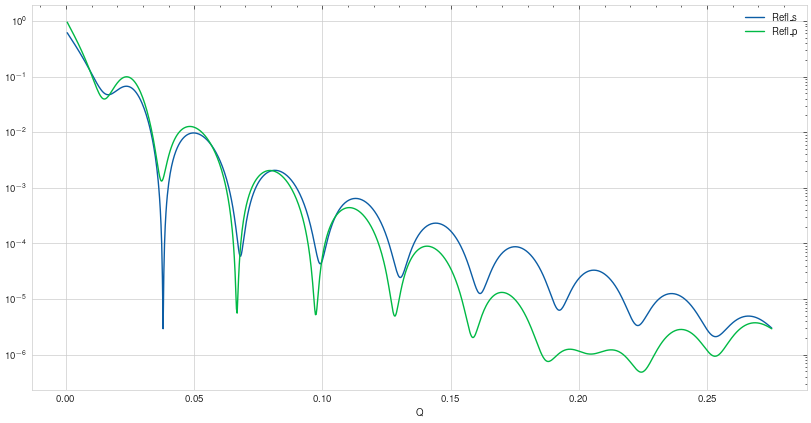

In [35]:
for i, obj in enumerate(obj_list):
    dfs = []
    for o in obj:
        o.plot(resid=True)
        structure = o.model.structure
        bulk = structure[2]
        oc_df = save_optical_constant(o.model.energy, bulk)
        dfs.append(oc_df)
        e = o.model.energy
        # Extract experimental Parameters

        scale_s = o.model.scale_s.value
        scale_p = o.model.scale_p.value
        bkg = o.model.bkg.value
        theta_offset_s = o.model.theta_offset_s.value
        theta_offset_p = o.model.theta_offset_p.value

        q_max = o.data.x.max()
        q = np.linspace(0.0005, q_max, 1000)
        model_spol = PXR_ReflectModel(structure, pol="s", energy=e, theta_offset={"s": theta_offset_s}, bkg = bkg, scale = {"s": scale_s})
        model_ppol = PXR_ReflectModel(structure, pol="p", energy=e, theta_offset={"p": theta_offset_p}, bkg = bkg, scale = {"p": scale_p})

        model_results = pd.DataFrame({
            "Q": q,
            "Refl_s": model_spol(q),
            "Refl_p": model_ppol(q),
        })
        model_results.plot(x = "Q", y = ["Refl_s", "Refl_p"], logy = True)
        model_results.to_csv(f"{e}_model_Struc{i}.csv")

    df = pd.concat(dfs, axis=1).T
    df.to_csv(f"Struc{i}_ocs.csv")
